In [1]:
import os
import sys
import re
import pickle
import anndata
import scanpy as sc
import numpy as np
import pandas as pd
import scipy.sparse
import scipy.cluster
import scipy.stats
import seaborn as sns
import gc
from tqdm import tqdm
import matplotlib.pyplot as plt
import statsmodels
from copy import deepcopy
import sfaira
import gseapy as gp
import matplotlib as mpl
from matplotlib_venn import venn2, venn2_circles
import upsetplot

import decoupler as dc
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

In [2]:
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import rpy2.robjects as robjects
import anndata2ri

pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

In [3]:
sc.settings.verbosity = 3
sc.set_figure_params(dpi=200)

In [4]:
%%R
library(edgeR)

---

In [5]:
protocol_short = {
    'Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017)': 'Andersen, 2020',
    'Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017); without DAPT': 'Andersen, 2020; without DAPT',
    'Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); directed': 'Bhaduri, 2020; directed',
    'Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); most directed': 'Bhaduri, 2020; most directed',
    'Birey, 2017 (doi: 10.1038/nature22330)': 'Birey, 2017',
    'Esk, 2020 (doi: 10.1126/science.abb5390)': 'Esk, 2020',
    'Fiorenzano, 2021 (doi: 10.1038/s41467-021-27464-5); silk': 'Fiorenzano, 2021; silk',
    'Fiorenzano, 2021 (doi: 10.1038/s41467-021-27464-5); standard': 'Fiorenzano, 2021; standard',
    'Fiorenzano, 2021 (doi:10.1038/s41467-021-27464-5); silk+laminin': 'Fiorenzano, 2021; silk+laminin',
    'Huang, 2021 (doi: 10.1016/j.stem.2021.04.006)': 'Huang, 2021',
    'Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)':  'Jo, 2016',
    'Lancaster, 2014 (doi: 10.1038/nprot.2014.158)': 'Lancaster, 2014',
    'Marton, 2019 (doi: 10.1038/s41593-018-0316-9)': 'Marton, 2019',
    'Miura, 2020 (doi: 10.1038/s41587-020-00763-w)': 'Miura, 2020',
    'Pasca, 2015 (doi: 10.1038/nmeth.3415)': 'Pasca, 2015',
    'Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hCO': 'Pellegrini, 2020; hCO',
    'Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hChPO': 'Pellegrini, 2020; hChPO',
    'Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)':  'Qian, 2016',
    'Qian, 2020 (doi: 10.1016/j.stem.2020.02.002)': 'Qian, 2020',
    'Quadrato, 2017 (doi: 10.1038/protex.2017.049)': 'Quadrato, 2017',
    'Quadrato, 2023 (doi: no_doi)': 'Quadrato, 2023',
    'Sawada, 2020 (doi: 10.1038/s41380-020-0844-z)': 'Sawada, 2020',
    'Trujillo, 2019 (doi: 10.1016/j.stem.2019.08.002)': 'Trujillo, 2019',
    'Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)': 'Velasco, 2019',
    'Watanabe, 2017 (doi: 10.1016/j.celrep.2017.09.047)': 'Watanabe, 2017',
    'Xiang, 2019 (doi: 10.1016/j.stem.2018.12.015)': 'Xiang, 2019',
    'Yoon, 2019 (doi: 10.1038/s41592-018-0255-0)': 'Yoon, 2019',
}

# Functions

In [6]:
def create_pseudobulk(adatas, celltype):
    adatas = [a[a.obs["neuron_subtype"] == celltype, cleaned_features].copy() for a in adatas]
    print("Number of cells for celltype", celltype)
    for a in adatas:
        print(len(a))
    print()
    adata_merge = anndata.concat(adatas)
    
    adata_merge.X = adata_merge.layers["counts"].copy()
    sc.pp.normalize_total(adata_merge, target_sum=1e6)
    sc.pp.log1p(adata_merge)
    
    adata_merge.obs["n_genes"] = (adata_merge.X>0).sum(axis=1).A.ravel()
    
    adata_merge.obs["onegroup"] = "onegroup"
    pdata = dc.get_pseudobulk(
        adata_merge,
        sample_col='batch',
        groups_col='onegroup',
        layer='counts',
        mode='sum',
        min_cells=10,
        min_counts=1000
    )
    pdata.X = np.round(pdata.X)
    pdata.obs["organoid_age_days"] = pdata.obs["organoid_age_days"].astype(np.float32)
    pdata.obs["n_genes_median"] = [adata_merge.obs.groupby("batch").median()["n_genes"].loc[i.split("_onegroup")[0]] for i in pdata.obs.index]
    pdata.obs["n_genes_std"] = [adata_merge.obs.groupby("batch").std()["n_genes"].loc[i.split("_onegroup")[0]] for i in pdata.obs.index]
    
    return pdata

In [7]:
robjects.r('''
    edger_fit <- function(pdata){
        # create an edgeR object with counts and grouping factor
        y <- DGEList(assay(pdata, "X"), group = colData(pdata)$assay_type_differentiation)
        # filter out genes with low counts
        keep <- filterByExpr(y)
        y <- y[keep, , keep.lib.sizes=FALSE]
        y <- calcNormFactors(y)
        # create a design matrix
        design <- model.matrix(~ colData(pdata)$assay_differentiation + colData(pdata)$psbulk_n_cells + colData(pdata)$organoid_age_days + colData(pdata)$n_genes_median + colData(pdata)$n_genes_std)
        y <- estimateDisp(y, design = design)
        fit <<- glmQLFit(y, design)
        #print(colnames(fit))
        return("success")
    }
    
    edger_test <- function(coef){
        test <- glmQLFTest(fit, coef=coef)
        tt <- topTags(test, n = Inf)
        return(tt$table)
    }
''')
r_edger_fit = robjects.globalenv['edger_fit']
r_edger_test = robjects.globalenv['edger_test']

def edger_test(coef, plot=True):
    out = robjects.conversion.rpy2py(r_edger_test(coef))
    out.columns = ["log2fc", "logCPM", "F", "pval", "qval"]
    out = out[["pval", "qval", "log2fc", "logCPM", "F"]]
    out["log2fc_abs"] = out["log2fc"].abs()
    if plot:
        dc.plot_volcano_df(out, x='log2fc', y='qval', top=30, figsize=(8,8))
        plt.show()
    return out

In [8]:
def get_sig_results(results_cleaned, qval_thres=0.05, lfc_abs_thres=0.5, lfc_dir=None):
    for k in results_cleaned.keys():
        results_cleaned[k] = results_cleaned[k].loc[results_cleaned[k]["qval"] < qval_thres].copy()
        results_cleaned[k] = results_cleaned[k].loc[results_cleaned[k]["log2fc_abs"] > lfc_abs_thres].copy()
        if lfc_dir == "up":
            results_cleaned[k] = results_cleaned[k].loc[results_cleaned[k]["log2fc"] > 0.0].copy()
        elif lfc_dir == "down":
            results_cleaned[k] = results_cleaned[k].loc[results_cleaned[k]["log2fc"] < 0.0].copy()
        elif lfc_dir is not None:
            raise ValueError(f"Incorrect lfc_dir provided: {lfc_dir}")
    return results_cleaned

In [9]:
def get_occurrence(results_cleaned):
    results_sets = {}
    if isinstance(next(iter(results_cleaned.values())), pd.DataFrame):
        for k in results_cleaned.keys():
            results_sets[k] = set(results_cleaned[k].index)
    else:
        for k in results_cleaned.keys():
            results_sets[k] = set(results_cleaned[k])
    all_genes = set()
    for k in results_sets.keys():
        all_genes |= results_sets[k]
    all_genes = list(all_genes)

    occurrence = {}
    for g in all_genes:
        c = 0
        for k in results_sets.keys():
            if g in results_sets[k]:
                c += 1
        occurrence[g] = c

    occurrence_inv = {i+1:[] for i in range(max(set(occurrence.values())))}
    for k, v in occurrence.items():
        occurrence_inv[v].append(k)

    for k, v in occurrence_inv.items():
        occurrence_inv[k] = sorted(v)
        
    return results_sets, occurrence_inv, occurrence

In [10]:
def enrichr(glist, background, gene_set="GO_Biological_Process_2021", nterms=10):
    res = gp.enrichr(
        gene_list=list(glist),
        gene_sets=[gene_set],
        outdir="enrichr/",
        no_plot=True,
        cutoff=0.05,
        background=background
    ).results.sort_values("Adjusted P-value", ascending=True)

    print(len(glist), "de genes")
    full_res = res.copy()
    res = res[res["Adjusted P-value"] < 0.05]
    if res.empty:
        print("no significant results")
        return
    res["-log10(qvalue)"] = -np.log(res["Adjusted P-value"])
    res["term_clean"] = res["Term"].str.split(" \(").str[0]
    ax = res.set_index("term_clean").iloc[:nterms]["-log10(qvalue)"].plot(kind="barh")
    ax.axvline(-np.log(0.05), ls="--", c="#000000")
    ax.invert_yaxis()
    plt.xlabel("-log10(qvalue)")
    plt.ylabel("GO-BP")
    return full_res

In [11]:
def clustermap(results_cleaned, results_sets, occurrence_inv, lower, upper, protocols=None, cluster_cut=None, optimal_ordering=False, savepath=None):
    accepted_genes = []
    for i in range(lower-1,upper):
        accepted_genes += occurrence_inv[i+1]
    accepted_genes = sorted(accepted_genes)
    print(len(accepted_genes), "genes shared between", lower, "and", upper, "protocols")

    df = pd.DataFrame(index=accepted_genes)
    df_dense = pd.DataFrame(index=accepted_genes)
    if protocols is None:
        protocols = results_sets.keys()
    for k in protocols:
        col = []
        col_dense = []
        for g in accepted_genes:
            if g in results_sets[k]:
                col.append(results_cleaned[k].loc[g, "log2fc"])
            else:
                col.append(0.0)
            col_dense.append(results[k].loc[g, "log2fc"])
        df[k] = col
        df_dense[k] = col_dense

    row_linkage = scipy.cluster.hierarchy.linkage(df_dense.values, method='ward', metric='euclidean', optimal_ordering=optimal_ordering)
    col_linkage = scipy.cluster.hierarchy.linkage(df_dense.values.T, method='ward', metric='euclidean', optimal_ordering=optimal_ordering)
    if cluster_cut is not None:
        clusters = pd.Series(scipy.cluster.hierarchy.fcluster(row_linkage, t=cluster_cut, criterion="distance"), index=df.index)
        cdict = dict(zip(np.unique(clusters), sc.pl.palettes.default_20))
        row_colors = clusters.map(cdict)
    else:
        row_colors = None
        clusters = None
        
    with mpl.rc_context({"axes.grid" : False}):
        cg = sns.clustermap(df, cmap="seismic", row_colors=row_colors, row_linkage=row_linkage, col_linkage=col_linkage, vmax=df.abs().max().max(), vmin=-df.abs().max().max());
        if cluster_cut is not None:
            # The following two lines generate custom fake lines that will be used as legend entries:
            markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in cdict.values()]
            plt.legend(markers, cdict.keys(), numpoints=1, loc=(20,-1), title="Clusters")
        if savepath is not None:
            cg.savefig(savepath, dpi=300)
    return clusters

# Load data

## Eze et al. 2021 Cortical Data

In [12]:
# file download: https://cells-test.gi.ucsc.edu/early-brain/counts_exprMatrix.tsv.gz
# file download: https://cells-test.gi.ucsc.edu/early-brain/meta.tsv
# file download: https://static-content.springer.com/esm/art%3A10.1038%2Fs41593-020-00794-1/MediaObjects/41593_2020_794_MOESM3_ESM.xlsx
eze_data = pd.read_csv("/storage/data/organoid_atlas_adatas/230628_eze_data/counts_exprMatrix.tsv.gz", sep="\t", index_col=0).T
eze_data = eze_data.loc[~(eze_data.T.max() == np.inf)].copy()
eze_meta = pd.read_csv("/storage/data/organoid_atlas_adatas/230628_eze_data/meta.tsv", sep="\t", index_col=0)
var = pd.DataFrame(
    index=sfaira.versions.genomes.translate_symbols_to_id(eze_data.columns.tolist(), release="104", organism="Homo sapiens"),
    data={"gene_symbol": eze_data.columns.tolist()}
)
adata_eze = anndata.AnnData(X=eze_data.values, var=var, obs=eze_meta.loc[eze_data.index])
adata_eze.var_names_make_unique()
adata_eze.layers["counts"] = np.round(adata_eze.X).copy()

eze_annot = pd.read_excel("/storage/data/organoid_atlas_adatas/230628_eze_data/41593_2020_794_MOESM3_ESM.xlsx", sheet_name="5 Cortex Annotations", index_col=0)
adata_eze.obs["Cell Type"] = eze_annot.loc[adata_eze.obs.index, "Cell Type"].tolist()

/home/ubuntu/venv/organoids/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [ ]:
sc.pp.normalize_total(adata_eze)
sc.pp.log1p(adata_eze)
sc.pp.highly_variable_genes(adata_eze, flavor="seurat_v3", layer="counts", n_top_genes=4000)
sc.pp.pca(adata_eze)
sc.pp.neighbors(adata_eze)
sc.tl.umap(adata_eze)

adata_eze.var["ensembl"] = adata_eze.var.index.tolist()
adata_eze.var = adata_eze.var.set_index("gene_symbol", drop=False)
sc.pl.umap(adata_eze[adata_eze.obs["Cell Type"] == "Neuronal"], color=["Individual", "STMN2", "NEUROD6", "GAD1"])
adata_eze[adata_eze.obs["Cell Type"] == "Neuronal"].obs["Individual"].value_counts()

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:12)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/ubuntu/venv/organoids/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/ubuntu/venv/organoids/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/ubuntu/venv/organoids/lib/python3.10/site-packages/umap/distances.py:1086: Num

In [ ]:
adata_eze_sub = adata_eze[adata_eze.obs["Cell Type"] == "Neuronal"].copy()
adata_eze_sub = adata_eze_sub[adata_eze_sub.obs["Individual"].isin(["CS14_3", "CS20", "CS22", "CS20"])].copy()

In [ ]:
adata_eze_sub

## Camp et al. 2015 Cortical Data

In [ ]:
camp_meta = pd.read_csv("/storage/data/organoid_atlas_adatas/230628_camp_data/data.metadata_cells.csv", index_col=0)
camp_data = pd.read_csv("/storage/data/organoid_atlas_adatas/230628_camp_data/data.TPM_cells.csv", index_col=0).T
camp_data.columns = [i.split(".")[0] for i in camp_data.columns]
adata_camp = anndata.AnnData(camp_data)
assert np.all(camp_meta.index == adata_camp.obs.index)
adata_camp.obs = camp_meta
adata_camp = adata_camp[adata_camp.obs["sample"].str.startswith("fetal")].copy()

In [ ]:
sc.pp.pca(adata_camp)
sc.pp.neighbors(adata_camp)
sc.tl.umap(adata_camp)
sc.tl.leiden(adata_camp, resolution=0.2)
sc.pl.umap(adata_camp, color=[
    "ENSG00000164600", # NEUROD6
    "ENSG00000104435", # STMN2
    "sample",
    "leiden"
])

adata_camp.layers["counts"] = np.round(adata_camp.X)

In [ ]:
adata_camp_sub = adata_camp[adata_camp.obs["leiden"] == "0"].copy()

## Braun et al. 2023 Fetal Data

In [ ]:
# file available here: https://storage.googleapis.com/linnarsson-lab-human/human_dev_GRCh38-3.0.0.h5ad
adata_braun = sc.read("/storage/data/organoid_atlas_adatas/230620_braun_data/human_dev_GRCh38-3_0_0_compressed.h5ad")
adata_braun.var_names_make_unique()

In [ ]:
meta = pd.read_csv("/storage/data/organoid_atlas_adatas/230620_braun_data/metadata_0628.tsv.gz", sep="\t", index_col=0)
meta = meta.loc[~pd.isna(meta["neuron_ntt_label"])].copy()
adata_braun = adata_braun[meta.index].copy()
adata_braun.obs = meta

## Organoid Atlas

In [ ]:
adata = sc.read("/storage/data/organoid_atlas_adatas/230620_10_updated_manual_annotation.h5ad")

In [ ]:
adata.layers["counts"] = adata.layers["counts_lengthnorm"].copy()
del adata.layers["counts_lengthnorm"]

In [ ]:
adata = adata[adata.obs["annot_level_1"] == "Neuron"].copy()

# Harmonize Data

In [ ]:
adata.obs["neuron_subtype"] = adata.obs["annot_level_4"].copy()

adata_braun.obs["batch"] = adata_braun.obs["SampleID"]
adata_braun.obs["organoid_age_days"] = adata_braun.obs["Age"] * 7.
adata_braun.obs["assay_sc"] = "10x 3' " + adata_braun.obs["Chemistry"].astype(str)
adata_braun.obs["assay_differentiation"] = "primary"
adata_braun.obs["assay_type_differentiation"] = "primary"
adata_braun.obs["cell_line"] = "primary"
adata_braun.obs["suspension_type"] = "cell"
adata_braun.obs["publication"] = "Braun, 2023"
adata_braun.obs["neuron_subtype"] = adata_braun.obs["neuron_ntt_label"].copy()

age_dict = {
    "fetal1": 7.*12.,
    "fetal2": 7.*12.,
    "fetal3": 7.*13.,
}
adata_camp.obs["batch"] = adata_camp.obs["sample"]
adata_camp.obs["organoid_age_days"] = adata_camp.obs["sample"].replace(age_dict)
adata_camp.obs["assay_sc"] = "Smart-seq2"
adata_camp.obs["assay_differentiation"] = "primary"
adata_camp.obs["assay_type_differentiation"] = "primary"
adata_camp.obs["cell_line"] = "primary"
adata_camp.obs["suspension_type"] = "cell"
adata_camp.obs["publication"] = "Camp, 2015"
adata_camp.obs["neuron_subtype"] = "Dorsal Telencephalic Neuron NT-VGLUT"

age_dict = {
    14: 32.0,
    20: 50.5,
    22: 54.0,
}
adata_eze.obs["batch"] = adata_eze.obs["Individual"]
adata_eze.obs["organoid_age_days"] = adata_eze.obs["Age_(Carnegie_Stage)"].replace(age_dict)
adata_eze.obs["assay_sc"] = "10x 3' v2"
adata_eze.obs["assay_differentiation"] = "primary"
adata_eze.obs["assay_type_differentiation"] = "primary"
adata_eze.obs["cell_line"] = "primary"
adata_eze.obs["suspension_type"] = "cell"
adata_eze.obs["publication"] = "Eze, 2021"
adata_eze.obs["neuron_subtype"] = "Dorsal Telencephalic Neuron NT-VGLUT"

In [ ]:
adata.var = adata.var.set_index("ensembl", drop=False)
adata_braun.var = adata_braun.var.set_index("Accession", drop=False)
adata_eze.var = adata_eze.var.set_index("ensembl", drop=False)
adata_camp = adata_camp[:, ~adata_camp.var.index.duplicated(keep=False)].copy()

joint_genes = sorted(list(set(adata.var.index) & set(adata_braun.var.index) & set(adata_camp.var.index) & set(adata_eze.var.index)))
pd.DataFrame(joint_genes).to_csv("/storage/data/organoid_atlas_adatas/230712_subtype_de_analysis/joint_genes.csv", header=None, index=None)

In [ ]:
joint_genes = pd.read_csv("/storage/data/organoid_atlas_adatas/230712_subtype_de_analysis/joint_genes.csv", header=None)[0].tolist()

In [ ]:
adata_braun = adata_braun[:, joint_genes].copy()
adata_braun.var.index = adata_braun.var["Gene"].tolist()
adata_braun.var_names_make_unique()
adata_braun.obs_names_make_unique()

adata_braun.X = adata_braun.layers["counts"].copy()
sc.pp.normalize_total(adata_braun, target_sum=1e6)
sc.pp.log1p(adata_braun)
sc.pp.filter_cells(adata_braun, min_genes=200)

adata_braun.write("/storage/data/organoid_atlas_adatas/230712_subtype_de_analysis/braun_neurons.h5ad")

In [ ]:
adata_camp = adata_camp[:, joint_genes].copy()
adata_camp.var.index = adata_braun.var.index.tolist()
adata_camp.obs_names_make_unique()

adata_camp.X = adata_camp.layers["counts"].copy()
sc.pp.normalize_total(adata_camp, target_sum=1e6)
sc.pp.log1p(adata_camp)
sc.pp.filter_cells(adata_camp, min_genes=200)

adata_camp.write("/storage/data/organoid_atlas_adatas/230712_subtype_de_analysis/camp_corticalneurons.h5ad")

In [ ]:
adata_eze = adata_eze[:, joint_genes].copy()
adata_eze.var.index = adata_braun.var.index.tolist()
adata_eze.obs_names_make_unique()

adata_eze.X = adata_eze.layers["counts"].copy()
sc.pp.normalize_total(adata_eze, target_sum=1e6)
sc.pp.log1p(adata_eze)
sc.pp.filter_cells(adata_eze, min_genes=200)

adata_eze.write("/storage/data/organoid_atlas_adatas/230712_subtype_de_analysis/eze_corticalneurons.h5ad")

In [ ]:
adata = adata[:, joint_genes].copy()
adata.var.index = adata_braun.var.index.tolist()
adata.obs_names_make_unique()

adata.X = adata.layers["counts"].copy()
sc.pp.normalize_total(adata, target_sum=1e6)
sc.pp.log1p(adata)
sc.pp.filter_cells(adata, min_genes=200)

adata.write("/storage/data/organoid_atlas_adatas/230712_subtype_de_analysis/organoids_neurons.h5ad")

# DE All Clusters

In [12]:
adata_camp = sc.read("/storage/data/organoid_atlas_adatas/230712_subtype_de_analysis/camp_corticalneurons.h5ad")
adata_braun = sc.read("/storage/data/organoid_atlas_adatas/230712_subtype_de_analysis/braun_neurons.h5ad")
adata_eze = sc.read("/storage/data/organoid_atlas_adatas/230712_subtype_de_analysis/eze_corticalneurons.h5ad")
adata = sc.read("/storage/data/organoid_atlas_adatas/230712_subtype_de_analysis/organoids_neurons.h5ad")

In [13]:
# Add updated region annotation
adata.obs["neuron_subtype"] = pd.read_csv("/storage/data/2405_revision/new_metadata/metadata_240523.tsv.gz", sep="\t", index_col=0, low_memory=False)["annot_level_4_rev2"]

In [14]:
# Remove any genes located on the X and Y Chromosome or expressed in less than 1% of organoids cells
xy_genes = pd.read_csv("/storage/data/organoid_atlas_adatas/xy_genes_biomart.tsv.gz", sep="\t", index_col=0).index
non_xy_genes = adata.var.set_index("ensembl", drop=False).drop([i for i in xy_genes if i in set(adata.var.set_index("ensembl", drop=False).index)])["gene_symbol"].values

n_cells = (adata.X > 0).sum(axis=0)
one_perc_genes = adata.var.iloc[np.where(n_cells.A.ravel() > round(0.01*adata.n_obs))[0]].index.tolist()

cleaned_features = sorted(list(set(one_perc_genes) & set(non_xy_genes)))

In [15]:
for ct in [i for i in adata.obs["neuron_subtype"].value_counts().index if "NT-VGLUT" in i or "NT-GABA" in i]:
    if ct == "Dorsal Telencephalic Neuron NT-VGLUT":
        pdata = create_pseudobulk([adata, adata_braun, adata_eze, adata_camp], ct)
    else:
        pdata = create_pseudobulk([adata, adata_braun], ct)

    print(pdata.obs["assay_differentiation"].value_counts())
    print()
    
    if ct == "Ventral Midbrain Neuron NT-VGLUT":
        min_samples = 2
    else:
        min_samples = 3

    assays_to_remove = []
    for k in pdata.obs["assay_differentiation"].unique().tolist():
        if len(pdata[pdata.obs["assay_differentiation"] == k]) < min_samples:
            assays_to_remove.append(k)
        if pdata[pdata.obs["assay_differentiation"] == k].obs["psbulk_n_cells"].sum() < 100:
            assays_to_remove.append(k)

    # Remove assays with less than two samples or less than 100 cells across all samples
    print(f"Removing {len(set(assays_to_remove))} assays: {set(assays_to_remove)}")
    print()
    pdata = pdata[~pdata.obs["assay_differentiation"].isin(assays_to_remove)].copy()

    pdata.obs["assay_differentiation"] = pd.Categorical(pdata.obs["assay_differentiation"], categories=["primary"] + sorted([i for i in pdata.obs["assay_differentiation"].unique() if i != "primary"]))
    print(pdata.obs["assay_differentiation"].value_counts())

    r_edger_fit(pdata)

    protocol_keys = {protocol_short[j]:i+2 for i, j in enumerate(pdata.obs["assay_differentiation"].cat.categories[1:])}
    results = {}
    with pd.ExcelWriter(f"/storage/data/2405_revision/240527_neural_subtype_de_update/all_cluster_de/{ct}.xlsx", engine='xlsxwriter') as writer:
        for name, coef in protocol_keys.items():
            edger_test(coef, plot=False).sort_values("qval").to_excel(writer, sheet_name=name)
    print("-----------------------------------------------------------------")
    print()
    print()

Number of cells for celltype Dorsal Telencephalic Neuron NT-VGLUT
518082
93337
7996
172

normalizing counts per cell
    finished (0:00:04)
Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)                    122
primary                                                            58
Yoon, 2019 (doi: 10.1038/s41592-018-0255-0)                        47
Lancaster, 2014 (doi: 10.1038/nprot.2014.158)                      40
Quadrato, 2017 (doi: 10.1038/protex.2017.049)                       8
Pasca, 2015 (doi: 10.1038/nmeth.3415)                               6
Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); most directed       5
Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); directed            5
Esk, 2020 (doi: 10.1126/science.abb5390)                            4
Fiorenzano, 2021 (doi: 10.1038/s41467-021-27464-5); standard        4
Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hCO                3
Watanabe, 2017 (doi: 10.1016/j.celrep.2017.09.047)                  3
Trujillo, 2019 (doi:

In [16]:
# create combined de file
df_all = pd.DataFrame(columns=["gene", "log2fc", "logCPM", "F", "pval", "qval", "neuron_subtype", "protocol"])
basepath = "/storage/data/2405_revision/240527_neural_subtype_de_update/all_cluster_de/"
for f in os.listdir(basepath):
    dfs = pd.read_excel(basepath+f, sheet_name=None, index_col=None)
    for prot, df in dfs.items():
        df = df.rename(columns={"Unnamed: 0": "gene"})
        df["neuron_subtype"] = f.split(".")[0]
        df["protocol"] = prot
        df_all = pd.concat((df_all, df), ignore_index=True)
df_all = df_all.loc[:, ["gene", "log2fc", "logCPM", "F", "pval", "qval", "neuron_subtype", "protocol"]]
df_all.to_csv("/storage/data/2405_revision/240527_neural_subtype_de_update/all_cluster_de_revision.tsv.gz", sep="\t")

# Enrichment: shared genes all clusters

In [17]:
min_sub = 14

In [18]:
basepath = "/storage/data/2405_revision/240527_neural_subtype_de_update/all_cluster_de/"

In [19]:
results_dict = {}
for f in os.listdir(basepath):
    results_dict[f] = pd.read_excel(basepath+f, sheet_name=None, index_col=0)

274 de genes


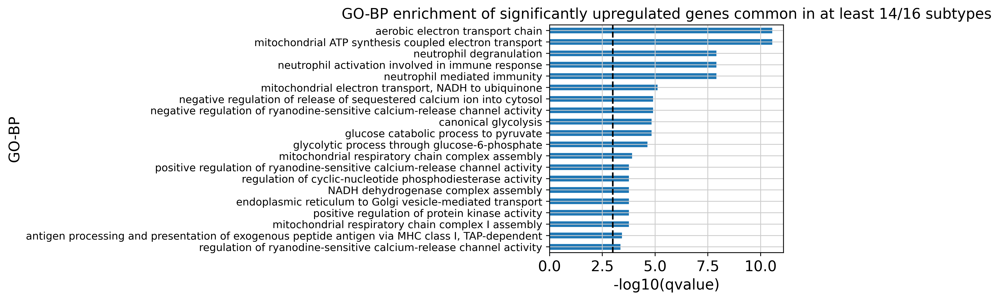

In [20]:
res = {}
for f in os.listdir(basepath):
    results_cleaned = get_sig_results(results_dict[f].copy(), qval_thres=0.05, lfc_abs_thres=0.5, lfc_dir="up")
    results_sets, occurrence_inv, occurrence = get_occurrence(results_cleaned)
    # get genes expressed in at least half the protocols
    genes = []
    for i in range(np.int32(np.ceil(len(results_cleaned)/2)), max(occurrence_inv.keys())+1):
        genes += occurrence_inv[i]
    res[f.split(".xlsx")[0]] = genes
results_sets, occurrence_inv, occurrence = get_occurrence(res)
enr_upregulated = enrichr(occurrence_inv[16]+occurrence_inv[15]+occurrence_inv[14], background=cleaned_features, nterms=20)
plt.yticks(fontsize=10)
plt.title(f"GO-BP enrichment of significantly upregulated genes common in at least {min_sub}/16 subtypes")
plt.savefig(f"/storage/data/2405_revision/240527_neural_subtype_de_update/common_de_genes_min{min_sub}/go_enrichment_common_upregulated_genes.png", dpi=300, bbox_inches='tight')

In [21]:
df_upregulated = pd.DataFrame(index=["de_in_n_subtypes"], data=occurrence).T

532 de genes


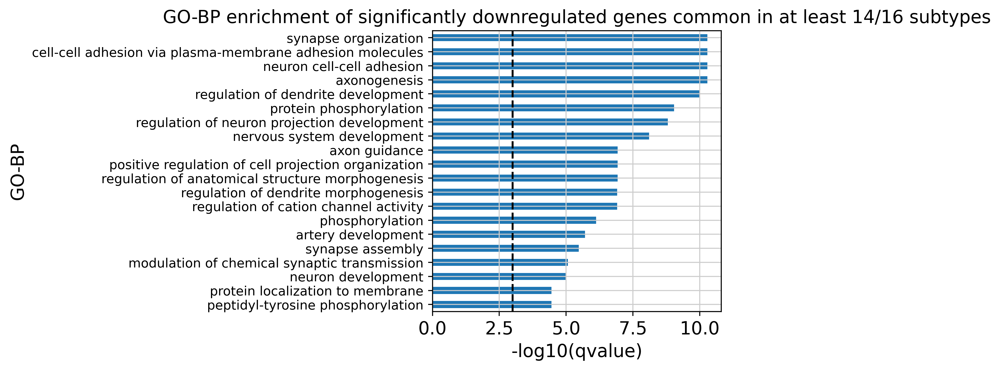

In [22]:
basepath = "/storage/data/2405_revision/240527_neural_subtype_de_update/all_cluster_de/"
res = {}
for f in os.listdir(basepath):
    results_cleaned = get_sig_results(results_dict[f].copy(), qval_thres=0.05, lfc_abs_thres=0.5, lfc_dir="down")
    results_sets, occurrence_inv, occurrence = get_occurrence(results_cleaned)
    # get genes expressed in at least half the protocols
    genes = []
    for i in range(np.int32(np.ceil(len(results_cleaned)/2)), max(occurrence_inv.keys())+1):
        genes += occurrence_inv[i]
    res[f.split(".xlsx")[0]] = genes
results_sets, occurrence_inv, occurrence = get_occurrence(res)
enr_downregulated = enrichr(occurrence_inv[16]+occurrence_inv[15]+occurrence_inv[14], background=cleaned_features, nterms=20)
plt.yticks(fontsize=10)
plt.title(f"GO-BP enrichment of significantly downregulated genes common in at least {min_sub}/16 subtypes")
plt.savefig(f"/storage/data/2405_revision/240527_neural_subtype_de_update/common_de_genes_min{min_sub}/go_enrichment_common_downregulated_genes.png", dpi=300, bbox_inches='tight')

In [23]:
df_downregulated = pd.DataFrame(index=["de_in_n_subtypes"], data=occurrence).T

In [24]:
results = {}
with pd.ExcelWriter(f"/storage/data/2405_revision/240527_neural_subtype_de_update/common_de_genes_min{min_sub}/occurrence_up_downregulated_genes.xlsx", engine='xlsxwriter') as writer:
    df_upregulated.to_excel(writer, sheet_name="occurrence_upregulated_genes")
    df_downregulated.to_excel(writer, sheet_name="occurrence_downregulated_genes")

In [25]:
results = {}
with pd.ExcelWriter(f"/storage/data/2405_revision/240527_neural_subtype_de_update/common_de_genes_min{min_sub}/enrichment_common_de_inatleast{min_sub}of16_subtypes.xlsx", engine='xlsxwriter') as writer:
    enr_upregulated.to_excel(writer, sheet_name="enrichment_upregulated_genes")
    enr_downregulated.to_excel(writer, sheet_name="enrichment_downregulated_genes")

# Validation analyis: Cortical DE using two fetal datasets (Eze & Braun)

## Velasco

In [15]:
robjects.r('''
    edger_test <- function(coef){
        test <- glmQLFTest(fit, coef=coef)
        tt <- topTags(test, n = Inf)
        return(tt$table)
    }
''')
edger_test = robjects.globalenv['edger_test']

def run_edger_test(coef, plot=True):
    out = robjects.conversion.rpy2py(edger_test(coef))
    out.columns = ["log2fc", "logCPM", "F", "pval", "qval"]
    out = out[["pval", "qval", "log2fc", "logCPM", "F"]]
    out["log2fc_abs"] = out["log2fc"].abs()
    if plot:
        dc.plot_volcano_df(out, x='log2fc', y='qval', top=30, figsize=(8,8))
        plt.show()
    return out

In [16]:
adata_sub = adata[(adata.obs["neuron_subtype"] == "Dorsal Telencephalic Neuron NT-VGLUT") & (adata.obs["assay_sc"].isin(["10x 3' v2"])) & (adata.obs["assay_differentiation"].isin(["Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)", "primary"]))].copy()
adata_braun_sub = adata_braun[(adata_braun.obs["neuron_subtype"] == "Dorsal Telencephalic Neuron NT-VGLUT") & (adata_braun.obs["assay_sc"].isin(["10x 3' v2"]))].copy()
adata_eze_sub = adata_eze[(adata_eze.obs["neuron_subtype"] == "Dorsal Telencephalic Neuron NT-VGLUT") & (adata_eze.obs["assay_sc"].isin(["10x 3' v2"]))].copy()

In [17]:
pdata = create_pseudobulk([adata_sub, adata_braun_sub, adata_eze_sub], "Dorsal Telencephalic Neuron NT-VGLUT")

Number of cells for celltype Dorsal Telencephalic Neuron NT-VGLUT
121280
44541
7996

normalizing counts per cell
    finished (0:00:00)


In [18]:
pdata.obs.loc[:, "assay_differentiation"] = pdata.obs.loc[:, "assay_differentiation"].astype(str)
pdata.obs.loc[pdata.obs["publication"] == "Braun, 2023", "assay_differentiation"] = "Braun, 2023"
pdata.obs.loc[pdata.obs["publication"] == "Eze, 2021", "assay_differentiation"] = "Eze, 2021"
pdata.obs["assay_differentiation"] = pd.Categorical(pdata.obs["assay_differentiation"], categories=['Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)', 'Braun, 2023', 'Eze, 2021'])

In [19]:
%%R -i pdata
# create an edgeR object with counts and grouping factor
y <- DGEList(assay(pdata, "X"), group = colData(pdata)$assay_differentiation)
# filter out genes with low counts
keep <- filterByExpr(y)
y <- y[keep, , keep.lib.sizes=FALSE]
y <- calcNormFactors(y)
# create a design matrix
design <- model.matrix(~ colData(pdata)$psbulk_n_cells + colData(pdata)$organoid_age_days + colData(pdata)$assay_differentiation)
y <- estimateDisp(y, design = design)
fit <- glmQLFit(y, design)
print(colnames(fit))

[1] "(Intercept)"                                    
[2] "colData(pdata)$psbulk_n_cells"                  
[3] "colData(pdata)$organoid_age_days"               
[4] "colData(pdata)$assay_differentiationBraun, 2023"
[5] "colData(pdata)$assay_differentiationEze, 2021"  


In [20]:
protocol_keys = {
    'Braun, 2023': 4,
    'Eze, 2021': 5,
}

Braun, 2023


/home/ubuntu/venv/organoids/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


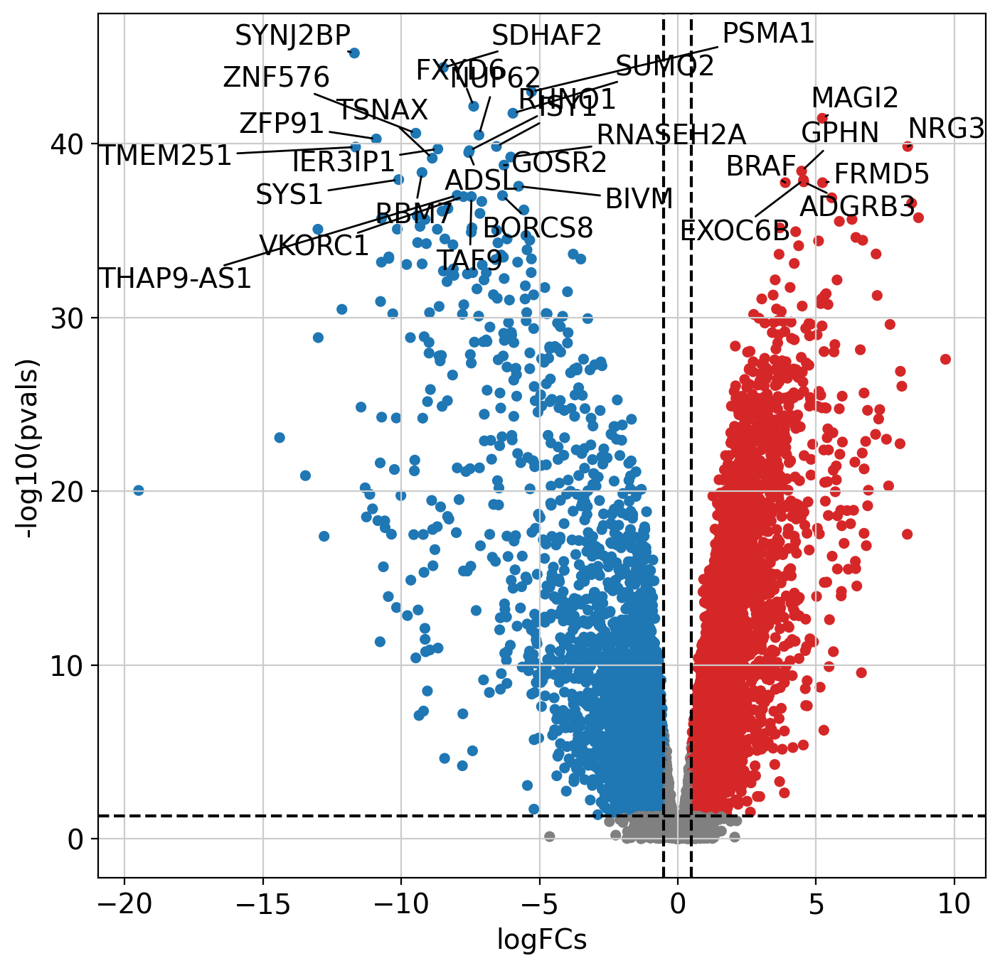

Braun, 2023 7046
Eze, 2021


/home/ubuntu/venv/organoids/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Figure size 800x800 with 0 Axes>

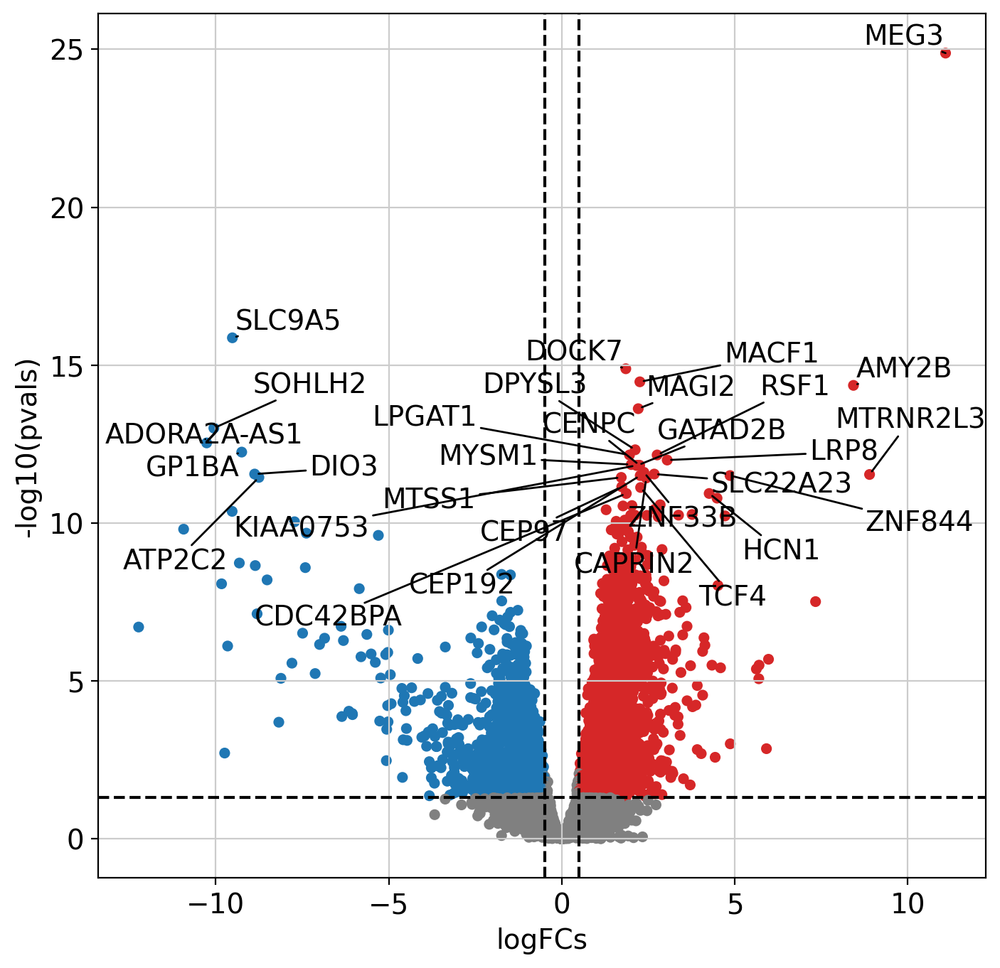

Eze, 2021 4793


<Figure size 800x800 with 0 Axes>

In [21]:
results = {}
with pd.ExcelWriter("/storage/data/2405_revision/240527_neural_subtype_de_update/velasco_vs_twoprimary/velasco_vs_twoprimary.xlsx", engine='xlsxwriter') as writer:
    for name, coef in protocol_keys.items():
        print(name)
        results[name] = run_edger_test(coef).sort_values("qval")
        plt.savefig(f"/storage/data/2405_revision/240527_neural_subtype_de_update/velasco_vs_twoprimary/volcano_{name.split(',')[0]}.pdf", bbox_inches="tight")
        print(name, len(results[name].loc[(results[name]["qval"] < 0.05) & (results[name]["log2fc_abs"] > 0.5)]))
        results[name].to_excel(writer, sheet_name=name)

In [53]:
results = pd.read_excel("/storage/data/2405_revision/240527_neural_subtype_de_update/velasco_vs_twoprimary/velasco_vs_twoprimary.xlsx", sheet_name=None, index_col=0)
results_cleaned = {}
for k in results.keys():
    results_cleaned[k] = results[k].loc[results[k]["log2fc_abs"] > 0.5].copy()
    results_cleaned[k] = results[k].loc[results[k]["qval"] < 0.05].copy()
    print(len(results_cleaned[k]), k)

8034 Braun, 2023
4849 Eze, 2021


In [23]:
results_sets = {}
for k in results_cleaned.keys():
    results_sets[k] = set(results_cleaned[k].index)
all_genes = set()
for k in results_sets.keys():
    all_genes |= results_sets[k]
all_genes = list(all_genes)

occurrence = {}
for g in all_genes:
    c = 0
    for k in results_sets.keys():
        if g in results_sets[k]:
            c += 1
    occurrence[g] = c

occurrence_inv = {i+1:[] for i in range(max(set(occurrence.values())))}
for k, v in occurrence.items():
    occurrence_inv[v].append(k)

for k, v in occurrence_inv.items():
    occurrence_inv[k] = sorted(v)

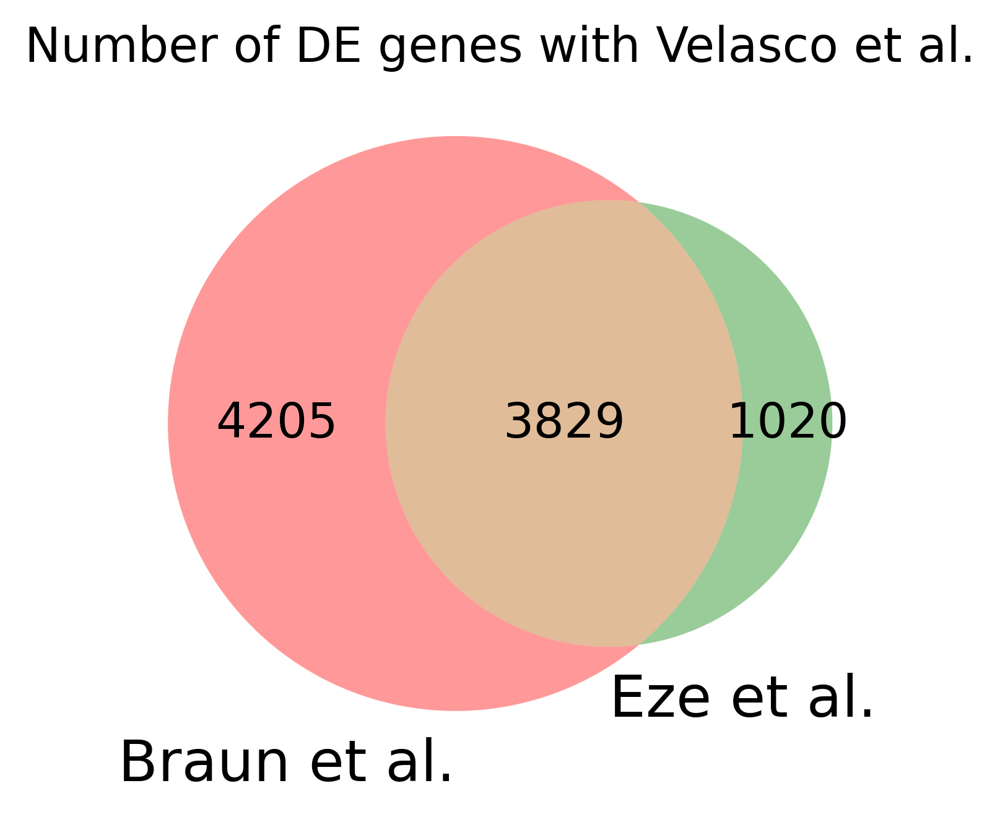

In [24]:
venn2((set(results_cleaned["Braun, 2023"].index),set(results_cleaned["Eze, 2021"].index)), set_labels=("Braun et al.", "Eze et al."))
plt.title("Number of DE genes with Velasco et al.")
plt.savefig("/storage/data/2405_revision/240527_neural_subtype_de_update/velasco_vs_twoprimary/venn.pdf", bbox_inches="tight")
plt.show()

In [25]:
# number of genes with aligned direction out of the shared DEGS
shared_degs = list(set(results_cleaned["Braun, 2023"].index) & set(results_cleaned["Eze, 2021"].index))
shared_direction = np.sign(results_cleaned["Braun, 2023"].loc[shared_degs, "log2fc"]) == np.sign(results_cleaned["Eze, 2021"].loc[shared_degs, "log2fc"])
shared_direction.value_counts()

True     3423
False     406
Name: log2fc, dtype: int64

In [26]:
#odds ratio and contingency table for the overlap
contingency_table = [
    [3829, 4205],
    [1020, 2582]
]
odds_ratio, p_value = scipy.stats.fisher_exact(contingency_table)
odds_ratio, p_value

(2.3050238977874145, 1.729723205098823e-87)

In [27]:
def clustermap(lower, upper, protocols=None, cluster_cut=None, optimal_ordering=False, nonsiglfc=False):
    accepted_genes = []
    for i in range(lower-1,upper):
        accepted_genes += occurrence_inv[i+1]
    accepted_genes = sorted(accepted_genes)
    print(len(accepted_genes), "genes shared between", lower, "and", upper, "protocols")

    df = pd.DataFrame(index=accepted_genes)
    df_dense = pd.DataFrame(index=accepted_genes)
    if protocols is None:
        protocols = results_sets.keys()
    for k in protocols:
        col = []
        col_dense = []
        for g in accepted_genes:
            if g in results_sets[k]:
                col.append(results_cleaned[k].loc[g, "log2fc"])
            else:
                col.append(0.0)
            col_dense.append(results[k].loc[g, "log2fc"])
        df[k] = col
        df_dense[k] = col_dense

    row_linkage = scipy.cluster.hierarchy.linkage(df_dense.values, method='ward', metric='euclidean', optimal_ordering=optimal_ordering)
    col_linkage = scipy.cluster.hierarchy.linkage(df_dense.values.T, method='ward', metric='euclidean', optimal_ordering=optimal_ordering)
    if cluster_cut is not None:
        clusters = pd.Series(scipy.cluster.hierarchy.fcluster(row_linkage, t=cluster_cut, criterion="distance"), index=df.index)
        cdict = dict(zip(np.unique(clusters), sc.pl.palettes.default_20))
        row_colors = clusters.map(cdict)
    else:
        row_colors = None
        clusters = None
    if nonsiglfc:
        df = df_dense

    sns.clustermap(df, cmap="seismic", row_colors=row_colors, row_linkage=row_linkage, col_linkage=col_linkage, vmax=df.abs().max().max(), vmin=-df.abs().max().max());
    
    if cluster_cut is not None:
        # The following two lines generate custom fake lines that will be used as legend entries:
        markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in cdict.values()]
        plt.legend(markers, cdict.keys(), numpoints=1, loc=(20,-1), title="Clusters")
    return clusters

9054 genes shared between 1 and 2 protocols


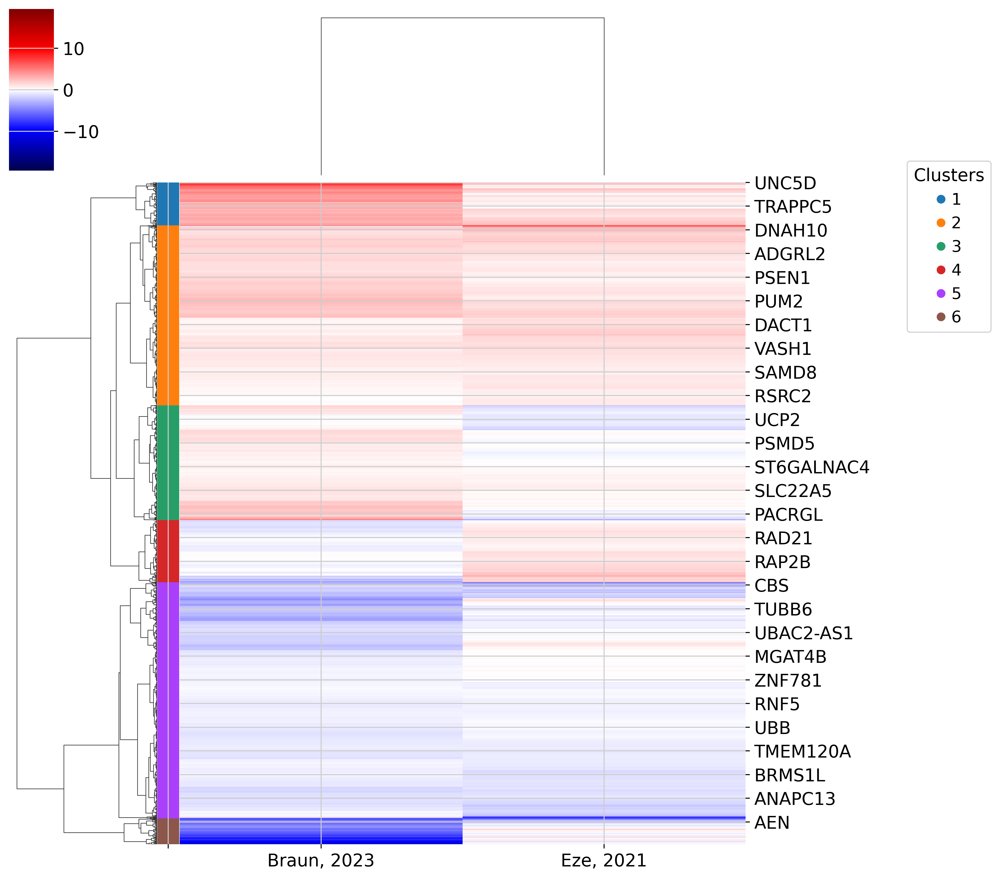

In [30]:
cl_cut = 60
cl = clustermap(1, 2, cluster_cut = cl_cut, optimal_ordering=True, nonsiglfc=True)
plt.savefig(f"/storage/data/2405_revision/240527_neural_subtype_de_update/velasco_vs_twoprimary/heatmap_allgenes_nonsiglfc_clustered{cl_cut}.pdf", bbox_inches="tight")

In [54]:
shared_degs = list(set(results_cleaned["Braun, 2023"].index) | set(results_cleaned["Eze, 2021"].index))
df = pd.DataFrame(index=shared_degs, data={"sign_braun_log2fc":np.sign(results["Braun, 2023"].loc[shared_degs, "log2fc"]), "sign_eze_log2fc":np.sign(results["Eze, 2021"].loc[shared_degs, "log2fc"])})

print("velasco")
print("braun- eze-", len(df.loc[(df["sign_braun_log2fc"]==-1)&(df["sign_eze_log2fc"]==-1)]), "genes")
print("braun+ eze+", len(df.loc[(df["sign_braun_log2fc"]==1)&(df["sign_eze_log2fc"]==1)]), "genes")
print("braun+ eze-", len(df.loc[(df["sign_braun_log2fc"]==1)&(df["sign_eze_log2fc"]==-1)]), "genes")
print("braun- eze+", len(df.loc[(df["sign_braun_log2fc"]==-1)&(df["sign_eze_log2fc"]==1)]), "genes")

velasco
braun- eze- 3020 genes
braun+ eze+ 3851 genes
braun+ eze- 784 genes
braun- eze+ 1399 genes


3049 de genes


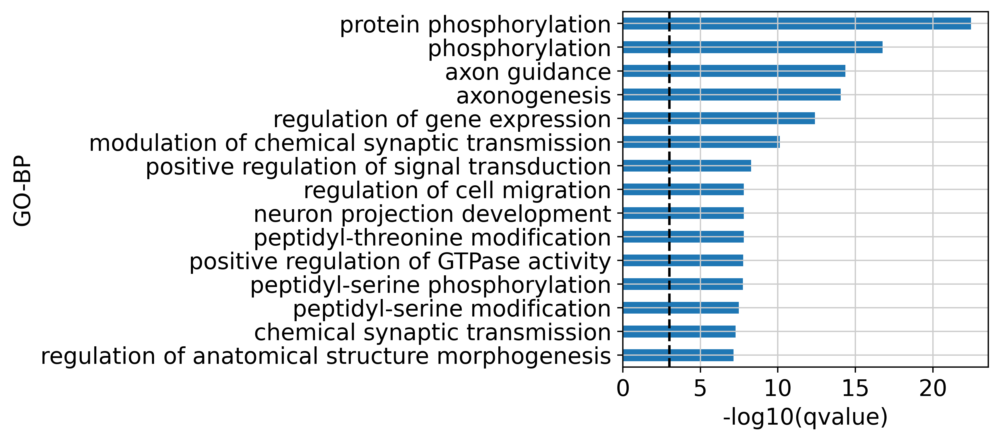

1570 de genes
no significant results


<Figure size 800x800 with 0 Axes>

852 de genes


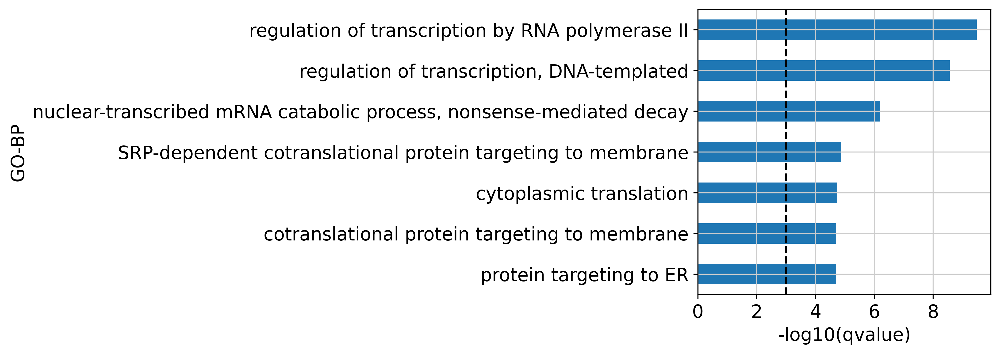

3231 de genes


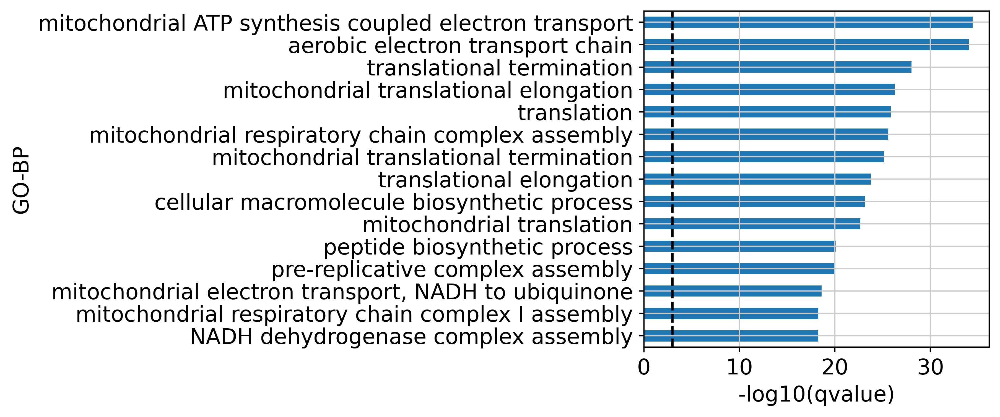

352 de genes
no significant results


<Figure size 800x800 with 0 Axes>

In [55]:
os.makedirs(f"/storage/data/2405_revision/240527_neural_subtype_de_update/velasco_vs_twoprimary/enr_barplots{cl_cut}_custom", exist_ok=True)
with pd.ExcelWriter(f"/storage/data/2405_revision/240527_neural_subtype_de_update/velasco_vs_twoprimary/enrichment_heatmap_clusters{cl_cut}_custom.xlsx", engine='xlsxwriter') as writer:
    for i in [[1,2], [3], [4], [5], [6]]:
        c_name = "_".join(np.array(i).astype(str))
        enr = enrichr(cl[cl.isin(i)].index.tolist(), background=cleaned_features, nterms=15)
        plt.savefig(f"/storage/data/2405_revision/240527_neural_subtype_de_update/velasco_vs_twoprimary/enr_barplots{cl_cut}_custom/enrichment_barplot_cluster{c_name}.pdf", dpi=300, bbox_inches="tight")
        plt.show()
        if enr is None:
            enr = pd.DataFrame()
        enr.to_excel(writer, sheet_name=f"cluster_{c_name}")

## Lancaster

In [15]:
robjects.r('''
    edger_test <- function(coef){
        test <- glmQLFTest(fit, coef=coef)
        tt <- topTags(test, n = Inf)
        return(tt$table)
    }
''')
edger_test = robjects.globalenv['edger_test']

def run_edger_test(coef, plot=True):
    out = robjects.conversion.rpy2py(edger_test(coef))
    out.columns = ["log2fc", "logCPM", "F", "pval", "qval"]
    out = out[["pval", "qval", "log2fc", "logCPM", "F"]]
    out["log2fc_abs"] = out["log2fc"].abs()
    if plot:
        dc.plot_volcano_df(out, x='log2fc', y='qval', top=30, figsize=(8,8))
        plt.show()
    return out

In [17]:
adata_sub = adata[(adata.obs["neuron_subtype"] == "Dorsal Telencephalic Neuron NT-VGLUT") & (adata.obs["assay_sc"].isin(["10x 3' v2"])) & (adata.obs["assay_differentiation"].isin(["Lancaster, 2014 (doi: 10.1038/nprot.2014.158)", "primary"]))].copy()
adata_braun_sub = adata_braun[(adata_braun.obs["neuron_subtype"] == "Dorsal Telencephalic Neuron NT-VGLUT") & (adata_braun.obs["assay_sc"].isin(["10x 3' v2"]))].copy()
adata_eze_sub = adata_eze[(adata_eze.obs["neuron_subtype"] == "Dorsal Telencephalic Neuron NT-VGLUT") & (adata_eze.obs["assay_sc"].isin(["10x 3' v2"]))].copy()

In [18]:
pdata = create_pseudobulk([adata_sub, adata_braun_sub, adata_eze_sub], "Dorsal Telencephalic Neuron NT-VGLUT")

Number of cells for celltype Dorsal Telencephalic Neuron NT-VGLUT
21329
44541
7996

normalizing counts per cell
    finished (0:00:00)


In [19]:
pdata.obs.loc[:, "assay_differentiation"] = pdata.obs.loc[:, "assay_differentiation"].astype(str)
pdata.obs.loc[pdata.obs["publication"] == "Braun, 2023", "assay_differentiation"] = "Braun, 2023"
pdata.obs.loc[pdata.obs["publication"] == "Eze, 2021", "assay_differentiation"] = "Eze, 2021"
pdata.obs["assay_differentiation"] = pd.Categorical(pdata.obs["assay_differentiation"], categories=['Lancaster, 2014 (doi: 10.1038/nprot.2014.158)', 'Braun, 2023', 'Eze, 2021'])

In [20]:
%%R -i pdata
# create an edgeR object with counts and grouping factor
y <- DGEList(assay(pdata, "X"), group = colData(pdata)$assay_differentiation)
# filter out genes with low counts
keep <- filterByExpr(y)
y <- y[keep, , keep.lib.sizes=FALSE]
y <- calcNormFactors(y)
# create a design matrix
design <- model.matrix(~ colData(pdata)$psbulk_n_cells + colData(pdata)$organoid_age_days + colData(pdata)$assay_differentiation)
y <- estimateDisp(y, design = design)
fit <- glmQLFit(y, design)
print(colnames(fit))

[1] "(Intercept)"                                    
[2] "colData(pdata)$psbulk_n_cells"                  
[3] "colData(pdata)$organoid_age_days"               
[4] "colData(pdata)$assay_differentiationBraun, 2023"
[5] "colData(pdata)$assay_differentiationEze, 2021"  


In [21]:
protocol_keys = {
    'Braun, 2023': 4,
    'Eze, 2021': 5,
}

Braun, 2023


/home/ubuntu/venv/organoids/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


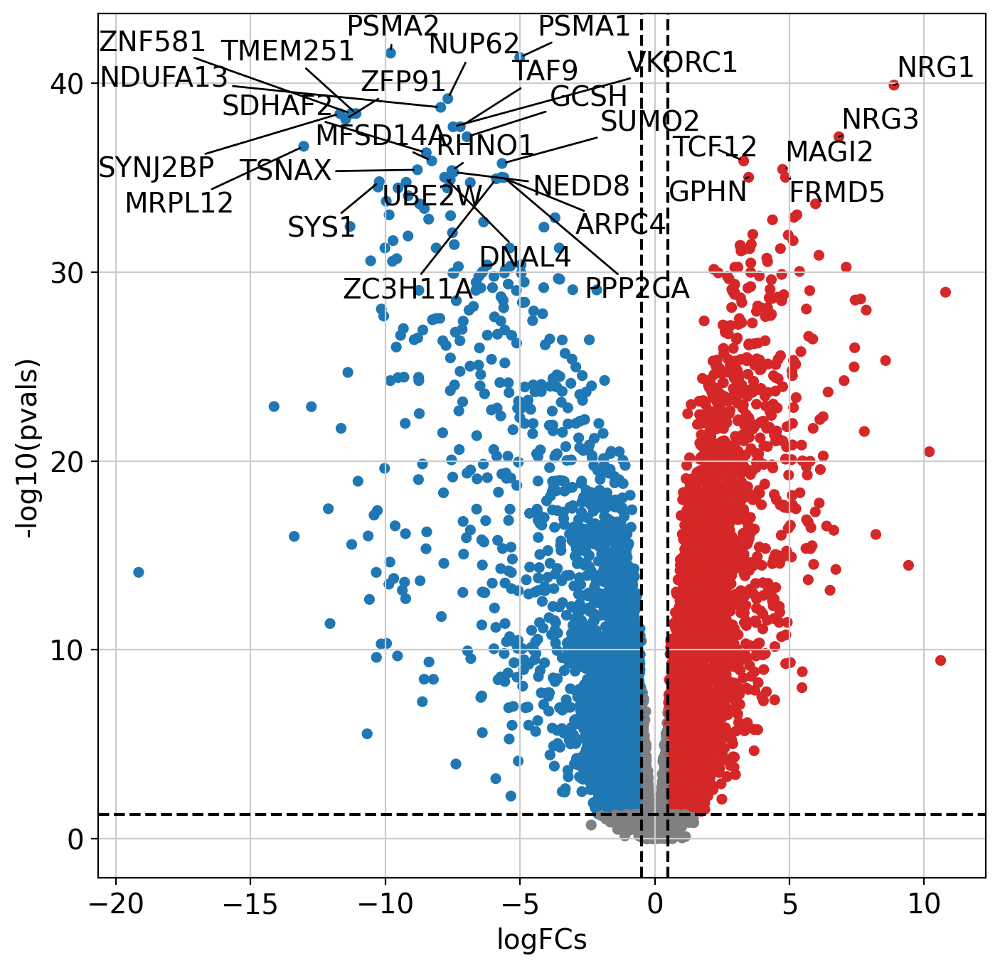

Braun, 2023 6730
Eze, 2021


/home/ubuntu/venv/organoids/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Figure size 800x800 with 0 Axes>

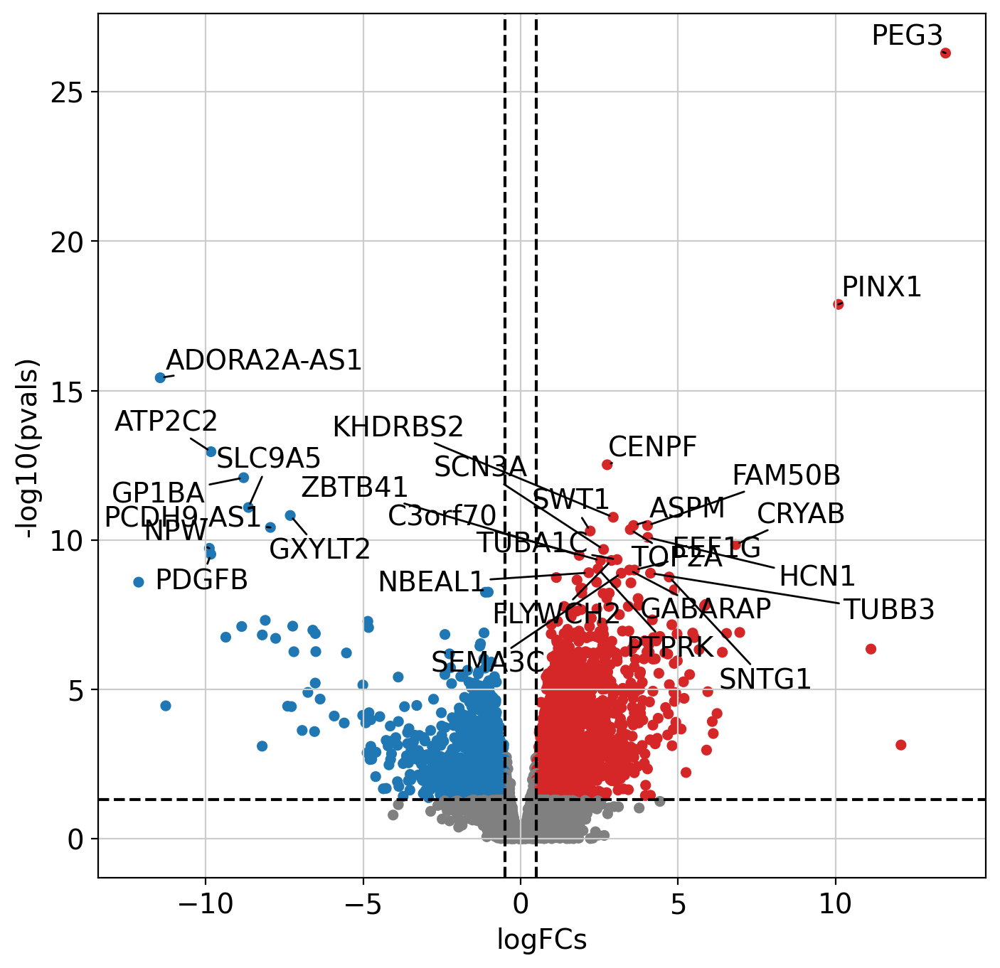

Eze, 2021 3527


<Figure size 800x800 with 0 Axes>

In [22]:
results = {}
with pd.ExcelWriter("/storage/data/2405_revision/240527_neural_subtype_de_update/lancaster_vs_twoprimary/lancaster_vs_twoprimary.xlsx", engine='xlsxwriter') as writer:
    for name, coef in protocol_keys.items():
        print(name)
        results[name] = run_edger_test(coef).sort_values("qval")
        plt.savefig(f"/storage/data/2405_revision/240527_neural_subtype_de_update/lancaster_vs_twoprimary/volcano_{name.split(',')[0]}.pdf", bbox_inches="tight")
        print(name, len(results[name].loc[(results[name]["qval"] < 0.05) & (results[name]["log2fc_abs"] > 0.5)]))
        results[name].to_excel(writer, sheet_name=name)

In [23]:
results = pd.read_excel("/storage/data/2405_revision/240527_neural_subtype_de_update/lancaster_vs_twoprimary/lancaster_vs_twoprimary.xlsx", sheet_name=None, index_col=0)
results_cleaned = {}
for k in results.keys():
    results_cleaned[k] = results[k].loc[results[k]["log2fc_abs"] > 0.5].copy()
    results_cleaned[k] = results[k].loc[results[k]["qval"] < 0.05].copy()
    print(len(results_cleaned[k]), k)

8228 Braun, 2023
3693 Eze, 2021


In [24]:
results_sets = {}
for k in results_cleaned.keys():
    results_sets[k] = set(results_cleaned[k].index)
all_genes = set()
for k in results_sets.keys():
    all_genes |= results_sets[k]
all_genes = list(all_genes)

occurrence = {}
for g in all_genes:
    c = 0
    for k in results_sets.keys():
        if g in results_sets[k]:
            c += 1
    occurrence[g] = c

occurrence_inv = {i+1:[] for i in range(max(set(occurrence.values())))}
for k, v in occurrence.items():
    occurrence_inv[v].append(k)

for k, v in occurrence_inv.items():
    occurrence_inv[k] = sorted(v)

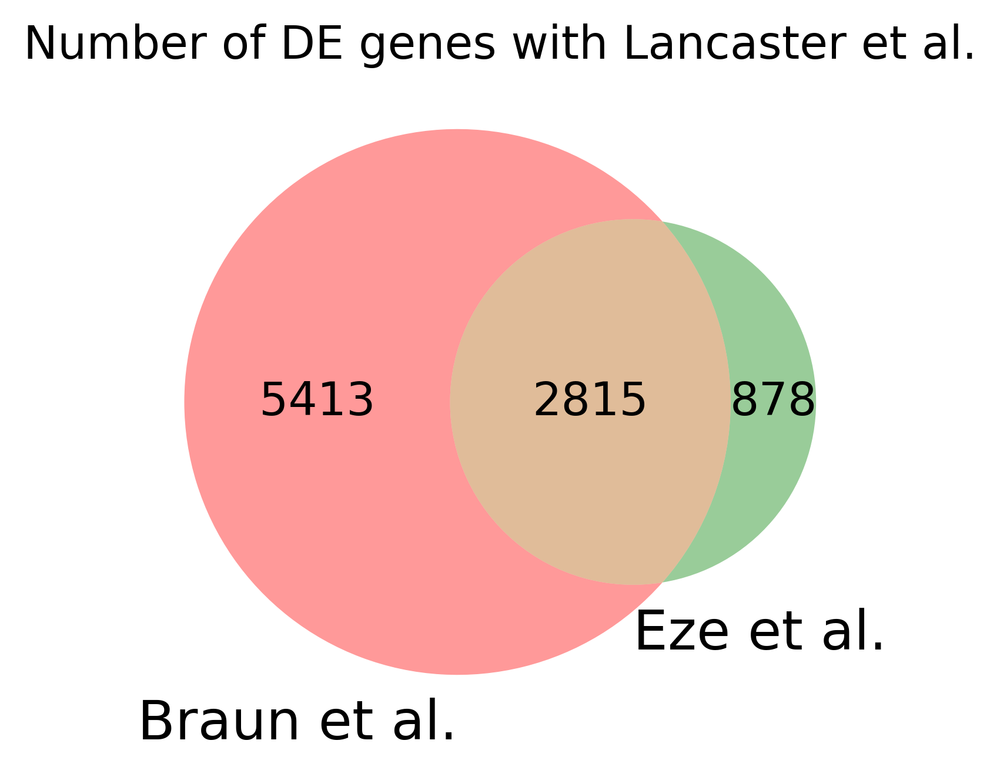

In [25]:
venn2((set(results_cleaned["Braun, 2023"].index),set(results_cleaned["Eze, 2021"].index)), set_labels=("Braun et al.", "Eze et al."))
plt.title("Number of DE genes with Lancaster et al.")
plt.savefig("/storage/data/2405_revision/240527_neural_subtype_de_update/lancaster_vs_twoprimary/venn.pdf", bbox_inches="tight")
plt.show()

In [26]:
# number of genes with aligned direction out of the shared DEGS
shared_degs = list(set(results_cleaned["Braun, 2023"].index) & set(results_cleaned["Eze, 2021"].index))
shared_direction = np.sign(results_cleaned["Braun, 2023"].loc[shared_degs, "log2fc"]) == np.sign(results_cleaned["Eze, 2021"].loc[shared_degs, "log2fc"])
shared_direction.value_counts()

True     2375
False     440
Name: log2fc, dtype: int64

In [29]:
len(cleaned_features)-878-2815-5413

2530

In [30]:
#odds ratio and contingency table for the overlap
contingency_table = [
    [2815, 5413],
    [878, 2530]
]
odds_ratio, p_value = scipy.stats.fisher_exact(contingency_table)
odds_ratio, p_value

(1.4985332282402906, 2.146909259323798e-19)

In [31]:
def clustermap(lower, upper, protocols=None, cluster_cut=None, optimal_ordering=False, nonsiglfc=False):
    accepted_genes = []
    for i in range(lower-1,upper):
        accepted_genes += occurrence_inv[i+1]
    accepted_genes = sorted(accepted_genes)
    print(len(accepted_genes), "genes shared between", lower, "and", upper, "protocols")

    df = pd.DataFrame(index=accepted_genes)
    df_dense = pd.DataFrame(index=accepted_genes)
    if protocols is None:
        protocols = results_sets.keys()
    for k in protocols:
        col = []
        col_dense = []
        for g in accepted_genes:
            if g in results_sets[k]:
                col.append(results_cleaned[k].loc[g, "log2fc"])
            else:
                col.append(0.0)
            col_dense.append(results[k].loc[g, "log2fc"])
        df[k] = col
        df_dense[k] = col_dense

    row_linkage = scipy.cluster.hierarchy.linkage(df_dense.values, method='ward', metric='euclidean', optimal_ordering=optimal_ordering)
    col_linkage = scipy.cluster.hierarchy.linkage(df_dense.values.T, method='ward', metric='euclidean', optimal_ordering=optimal_ordering)
    if cluster_cut is not None:
        clusters = pd.Series(scipy.cluster.hierarchy.fcluster(row_linkage, t=cluster_cut, criterion="distance"), index=df.index)
        cdict = dict(zip(np.unique(clusters), sc.pl.palettes.default_20))
        row_colors = clusters.map(cdict)
    else:
        row_colors = None
        clusters = None
    if nonsiglfc:
        df = df_dense

    sns.clustermap(df, cmap="seismic", row_colors=row_colors, row_linkage=row_linkage, col_linkage=col_linkage, vmax=df.abs().max().max(), vmin=-df.abs().max().max());
    
    if cluster_cut is not None:
        # The following two lines generate custom fake lines that will be used as legend entries:
        markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in cdict.values()]
        plt.legend(markers, cdict.keys(), numpoints=1, loc=(20,-1), title="Clusters")
    return clusters

9106 genes shared between 1 and 2 protocols


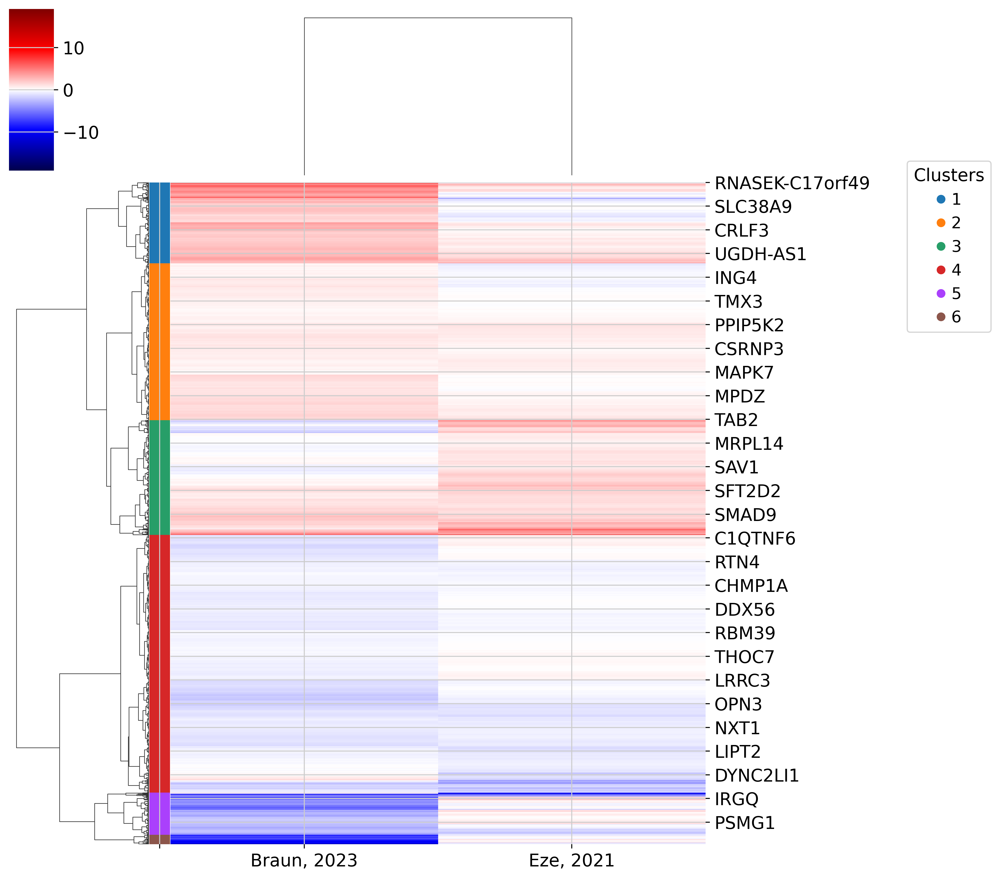

In [32]:
cl_cut = 60
cl = clustermap(1, 2, cluster_cut = cl_cut, optimal_ordering=True, nonsiglfc=True)
plt.savefig(f"/storage/data/2405_revision/240527_neural_subtype_de_update/lancaster_vs_twoprimary/heatmap_allgenes_nonsiglfc_clustered{cl_cut}.pdf", bbox_inches="tight")

In [52]:
shared_degs = list(set(results_cleaned["Braun, 2023"].index) | set(results_cleaned["Eze, 2021"].index))
df = pd.DataFrame(index=shared_degs, data={"sign_braun_log2fc":np.sign(results["Braun, 2023"].loc[shared_degs, "log2fc"]), "sign_eze_log2fc":np.sign(results["Eze, 2021"].loc[shared_degs, "log2fc"])})

print("lancaster")
print("braun- eze-", len(df.loc[(df["sign_braun_log2fc"]==-1)&(df["sign_eze_log2fc"]==-1)]), "genes")
print("braun+ eze+", len(df.loc[(df["sign_braun_log2fc"]==1)&(df["sign_eze_log2fc"]==1)]), "genes")
print("braun+ eze-", len(df.loc[(df["sign_braun_log2fc"]==1)&(df["sign_eze_log2fc"]==-1)]), "genes")
print("braun- eze+", len(df.loc[(df["sign_braun_log2fc"]==-1)&(df["sign_eze_log2fc"]==1)]), "genes")

lancaster
braun- eze- 2876 genes
braun+ eze+ 3375 genes
braun+ eze- 1053 genes
braun- eze+ 1802 genes


# Computing DE between organoids and primary brain split by cortical neuron dataset

In [12]:
adata = sc.read("/storage/data/organoid_atlas_adatas/230712_subtype_de_analysis/organoids_neurons.h5ad")
adata_braun = sc.read("/storage/data/organoid_atlas_adatas/230712_subtype_de_analysis/braun_neurons.h5ad")

In [13]:
# Add updated region annotation
adata.obs["neuron_subtype"] = pd.read_csv("/storage/data/2405_revision/new_metadata/metadata_240523.tsv.gz", sep="\t", index_col=0, low_memory=False)["annot_level_4_rev2"]

In [14]:
# Remove any genes located on the X and Y Chromosome or expressed in less than 1% of organoids cells
xy_genes = pd.read_csv("/storage/data/organoid_atlas_adatas/xy_genes_biomart.tsv.gz", sep="\t", index_col=0).index
non_xy_genes = adata.var.set_index("ensembl", drop=False).drop([i for i in xy_genes if i in set(adata.var.set_index("ensembl", drop=False).index)])["gene_symbol"].values

n_cells = (adata.X > 0).sum(axis=0)
one_perc_genes = adata.var.iloc[np.where(n_cells.A.ravel() > round(0.01*adata.n_obs))[0]].index.tolist()

cleaned_features = sorted(list(set(one_perc_genes) & set(non_xy_genes)))

In [15]:
ct = "Dorsal Telencephalic Neuron NT-VGLUT"
pdata = create_pseudobulk([adata, adata_braun], ct)

Number of cells for celltype Dorsal Telencephalic Neuron NT-VGLUT
518082
93337

normalizing counts per cell
    finished (0:00:04)


In [16]:
pdata

AnnData object with n_obs × n_vars = 313 × 11636
    obs: 'assay_sc', 'assay_differentiation', 'assay_type_differentiation', 'cell_line', 'suspension_type', 'organoid_age_days', 'publication', 'batch', 'neuron_subtype', 'onegroup', 'psbulk_n_cells', 'psbulk_counts', 'n_genes_median', 'n_genes_std'
    layers: 'psbulk_props'

In [17]:
pdata.obs["publication_protocol"] = pdata.obs["publication"].astype("str") + "_" + pdata.obs["assay_differentiation"].astype("str").replace(protocol_short)

In [18]:
print(pdata.obs["publication_protocol"].value_counts())
print()

Paulsen, 2022_Velasco, 2019                    54
Braun, 2023_primary                            52
Bowles, 2021_Yoon, 2019                        44
Uzquiano, 2022_Velasco, 2019                   39
Kanton, 2019_Lancaster, 2014                   25
Velasco, 2019_Velasco, 2019                    20
He, 2022_Lancaster, 2014                       10
Bhaduri, 2020_Velasco, 2019                     9
Uzquiano, 2022_Quadrato, 2017                   8
Bhaduri, 2020_Bhaduri, 2020; directed           5
Bhaduri, 2020_Bhaduri, 2020; most directed      5
Fleck, 2022_Lancaster, 2014                     5
Fiorenzano, 2021_Fiorenzano, 2021; standard     4
Vertesy, 2022_Esk, 2020                         4
Andersen, 2020_Andersen, 2020                   3
Yoon, 2019_Yoon, 2019                           3
Trujillo, 2019_Trujillo, 2019                   3
Sloan, 2017_Pasca, 2015                         3
Samarasinghe, 2021_Watanabe, 2017               3
Miura, 2020_Miura, 2020                         3


In [19]:
ds_to_remove = []
for k in pdata.obs["publication_protocol"].unique().tolist():
    if len(pdata[pdata.obs["publication_protocol"] == k]) < 3:
        ds_to_remove.append(k)
    if pdata[pdata.obs["publication_protocol"] == k].obs["psbulk_n_cells"].sum() < 100:
        ds_to_remove.append(k)

# Remove assays with less than two samples or less than 100 cells across all samples
print(f"Removing {len(set(ds_to_remove))} assays: {set(ds_to_remove)}")
print()

Removing 10 assays: {'Andersen, 2020_Andersen, 2020; without DAPT', 'Pellegrini, 2020_Pellegrini, 2020; hCO', 'Kelava, 2022_Pellegrini, 2020; hCO', 'Qian, 2020_Qian, 2020', 'Khan, 2020_Pasca, 2015', 'Xiang, 2019_Xiang, 2019', 'Fiorenzano, 2021_Fiorenzano, 2021; standard', 'Birey, 2017_Birey, 2017', 'Birey, 2017_Pasca, 2015', 'Andersen, 2020_Andersen, 2020'}



In [26]:
pdata = pdata[~pdata.obs["publication_protocol"].isin(ds_to_remove)].copy()
pdata.obs["publication_protocol"] = pd.Categorical(pdata.obs["publication_protocol"], categories=["Braun, 2023_primary"] + sorted([i for i in pdata.obs["publication_protocol"].unique() if i != "Braun, 2023_primary"]))
print(pdata.obs["publication_protocol"].value_counts())

Paulsen, 2022_Velasco, 2019                   54
Braun, 2023_primary                           52
Bowles, 2021_Yoon, 2019                       44
Uzquiano, 2022_Velasco, 2019                  39
Kanton, 2019_Lancaster, 2014                  25
Velasco, 2019_Velasco, 2019                   20
He, 2022_Lancaster, 2014                      10
Bhaduri, 2020_Velasco, 2019                    9
Uzquiano, 2022_Quadrato, 2017                  8
Bhaduri, 2020_Bhaduri, 2020; most directed     5
Fleck, 2022_Lancaster, 2014                    5
Bhaduri, 2020_Bhaduri, 2020; directed          5
Vertesy, 2022_Esk, 2020                        4
Miura, 2020_Miura, 2020                        3
Samarasinghe, 2021_Watanabe, 2017              3
Sloan, 2017_Pasca, 2015                        3
Trujillo, 2019_Trujillo, 2019                  3
Yoon, 2019_Yoon, 2019                          3
Name: publication_protocol, dtype: int64


In [27]:
# redefine function for different coefficient (publication_protocol)

robjects.r('''
    edger_fit <- function(pdata){
        # create an edgeR object with counts and grouping factor
        y <- DGEList(assay(pdata, "X"), group = colData(pdata)$assay_type_differentiation)
        # filter out genes with low counts
        keep <- filterByExpr(y)
        y <- y[keep, , keep.lib.sizes=FALSE]
        y <- calcNormFactors(y)
        # create a design matrix
        design <- model.matrix(~ colData(pdata)$publication_protocol + colData(pdata)$psbulk_n_cells + colData(pdata)$organoid_age_days + colData(pdata)$n_genes_median + colData(pdata)$n_genes_std)
        y <- estimateDisp(y, design = design)
        fit <<- glmQLFit(y, design)
        #print(colnames(fit))
        return("success")
    }
    
    edger_test <- function(coef){
        test <- glmQLFTest(fit, coef=coef)
        tt <- topTags(test, n = Inf)
        return(tt$table)
    }
''')
r_edger_fit = robjects.globalenv['edger_fit']
r_edger_test = robjects.globalenv['edger_test']

def edger_test(coef, plot=True):
    out = robjects.conversion.rpy2py(r_edger_test(coef))
    out.columns = ["log2fc", "logCPM", "F", "pval", "qval"]
    out = out[["pval", "qval", "log2fc", "logCPM", "F"]]
    out["log2fc_abs"] = out["log2fc"].abs()
    if plot:
        dc.plot_volcano_df(out, x='log2fc', y='qval', top=30, figsize=(8,8))
        plt.show()
    return out

In [28]:
r_edger_fit(pdata)

array(['success'], dtype='<U7')

In [29]:
protocol_keys = {j:i+2 for i, j in enumerate(pdata.obs["publication_protocol"].cat.categories[1:])}
results = {}

In [30]:
protocol_keys

{'Bhaduri, 2020_Bhaduri, 2020; directed': 2,
 'Bhaduri, 2020_Bhaduri, 2020; most directed': 3,
 'Bhaduri, 2020_Velasco, 2019': 4,
 'Bowles, 2021_Yoon, 2019': 5,
 'Fleck, 2022_Lancaster, 2014': 6,
 'He, 2022_Lancaster, 2014': 7,
 'Kanton, 2019_Lancaster, 2014': 8,
 'Miura, 2020_Miura, 2020': 9,
 'Paulsen, 2022_Velasco, 2019': 10,
 'Samarasinghe, 2021_Watanabe, 2017': 11,
 'Sloan, 2017_Pasca, 2015': 12,
 'Trujillo, 2019_Trujillo, 2019': 13,
 'Uzquiano, 2022_Quadrato, 2017': 14,
 'Uzquiano, 2022_Velasco, 2019': 15,
 'Velasco, 2019_Velasco, 2019': 16,
 'Vertesy, 2022_Esk, 2020': 17,
 'Yoon, 2019_Yoon, 2019': 18}

In [31]:
%%R
print(colnames(coef(fit)))

 [1] "(Intercept)"                                                                  
 [2] "colData(pdata)$publication_protocolBhaduri, 2020_Bhaduri, 2020; directed"     
 [3] "colData(pdata)$publication_protocolBhaduri, 2020_Bhaduri, 2020; most directed"
 [4] "colData(pdata)$publication_protocolBhaduri, 2020_Velasco, 2019"               
 [5] "colData(pdata)$publication_protocolBowles, 2021_Yoon, 2019"                   
 [6] "colData(pdata)$publication_protocolFleck, 2022_Lancaster, 2014"               
 [7] "colData(pdata)$publication_protocolHe, 2022_Lancaster, 2014"                  
 [8] "colData(pdata)$publication_protocolKanton, 2019_Lancaster, 2014"              
 [9] "colData(pdata)$publication_protocolMiura, 2020_Miura, 2020"                   
[10] "colData(pdata)$publication_protocolPaulsen, 2022_Velasco, 2019"               
[11] "colData(pdata)$publication_protocolSamarasinghe, 2021_Watanabe, 2017"         
[12] "colData(pdata)$publication_protocolSloan, 2017_Pasca, 2015"

In [32]:
with pd.ExcelWriter(f"/storage/data/2405_revision/240604_dataset_de_cortical_neurons/dataset_vs_braun_{ct}.xlsx", engine='xlsxwriter') as writer:
    for name, coef in protocol_keys.items():
        edger_test(coef, plot=False).sort_values("qval").to_excel(writer, sheet_name=name[:31])

In [33]:
#get all DEGs
de = pd.read_excel("/storage/data/2405_revision/240604_dataset_de_cortical_neurons/dataset_vs_braun_Dorsal Telencephalic Neuron NT-VGLUT.xlsx", sheet_name=None, index_col=0)

In [34]:
de_sig = get_sig_results(de.copy(), qval_thres=0.05, lfc_abs_thres=0.5, lfc_dir=None)

In [35]:
degs_all = set()
degs_union = set()
for k, v in de_sig.items():
    degs_all |= set(v.index)
    degs_union &= set(v.index)

In [36]:
print(len(degs_union))
print(len(degs_all))

0
11586


In [37]:
degs_all = list(degs_all)

In [38]:
df = pd.DataFrame(index=degs_all)

for k, v in de.items():
    df[k] = v.loc[degs_all, "log2fc"]

In [39]:
pub_prot = df.columns.copy().tolist()

In [45]:
pub = [i.split("_")[0] for i in pub_prot]
prot = [i.split("_")[1] for i in pub_prot]

In [62]:
df.columns = pub_prot

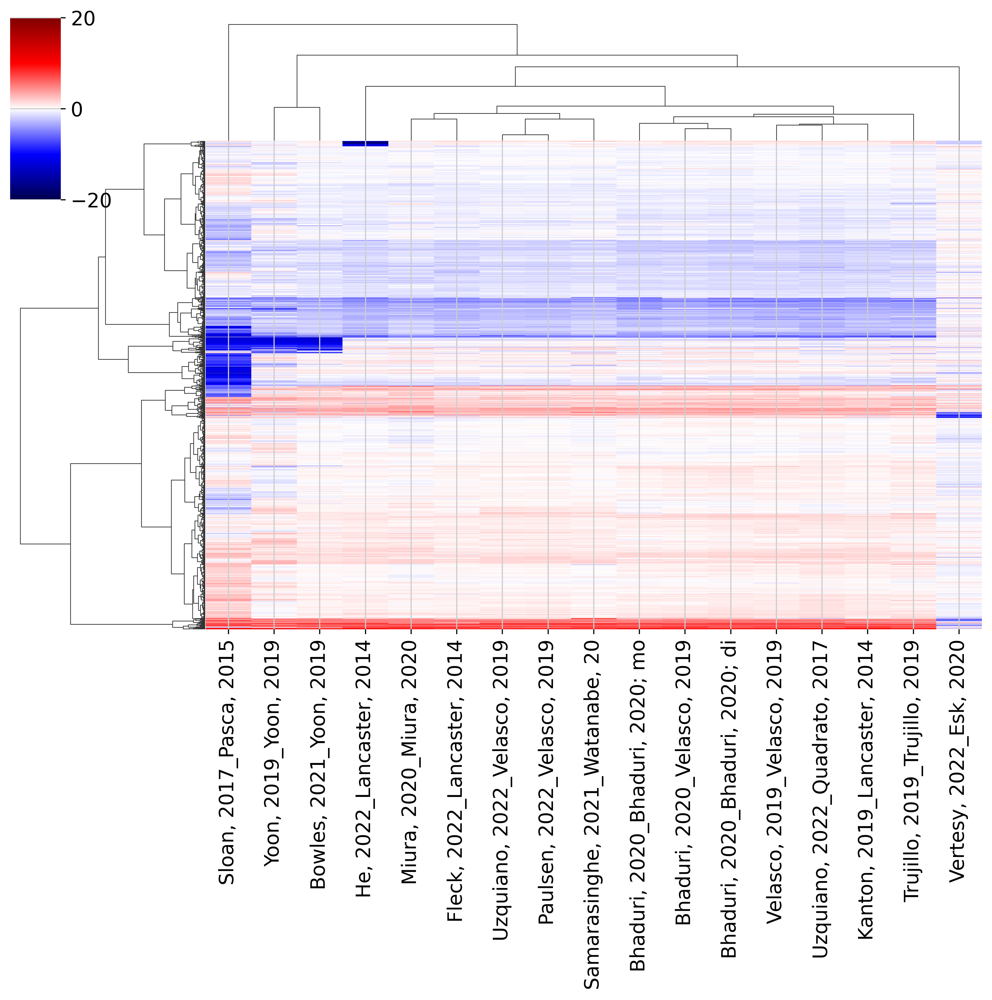

In [69]:
row_linkage = scipy.cluster.hierarchy.linkage(df, method='ward', metric='euclidean', optimal_ordering=True)
col_linkage = scipy.cluster.hierarchy.linkage(df.T, method='ward', metric='euclidean', optimal_ordering=True)
row_colors = None
clusters = None

cl = sns.clustermap(
    df, 
    cmap="seismic", 
    row_colors=row_colors, 
    row_linkage=row_linkage, 
    col_linkage=col_linkage, 
    vmax=df.abs().max().max(), 
    vmin=-df.abs().max().max(),
    xticklabels=True,
    yticklabels=False,
);

plt.savefig("/storage/data/2405_revision/240527_neural_subtype_de_update/datasets-prot_vs_braun/heatmap_alldegs_datasets_vs_braun.pdf", bbox_inches="tight", dpi=300)

In [77]:
colortable = pd.read_csv("/storage/data/2405_revision/metadata_datasets_with_colors.tsv", sep="\t")

In [113]:
pub_colors = {
    i:colortable.set_index("publication").loc[[i], "color_publication"].iloc[0] \
    for i in colortable["publication"].unique()
}

prot_colors = {
    protocol_short[i]:colortable.set_index("assay_differentiation").loc[[i], "color_protocol"].iloc[0] \
    for i in colortable["assay_differentiation"].unique()
}

prot_type_colors = {
    protocol_short[i]:colortable.set_index("assay_differentiation").loc[[i], "color_protocoltype"].iloc[0] \
    for i in colortable["assay_differentiation"].unique()
}

In [134]:
order = df.columns[cl.dendrogram_col.reordered_ind]

pub = [pub_colors[i.split("_")[0]] for i in order]

prot = []
prot_type = []
for i in order:
    i.split("_")[1]
    hits = []
    prot_name = i.split("_")[1]
    for k, v in prot_colors.items():
        if k.startswith(prot_name):
            hits.append(k)
    assert len(hits) == 1
    prot.append(prot_colors[hits[0]])
    prot_type.append(prot_type_colors[hits[0]])

In [119]:
def plot_palette(colors):
    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(len(colors), 1))

    # Remove axis
    ax.set_axis_off()

    # Plot each color as a rectangle
    for i, color in enumerate(colors):
        rect = plt.Rectangle((i, 0), 1, 1, color=color)
        ax.add_patch(rect)

    # Set the limits of the plot
    ax.set_xlim(0, len(colors))
    ax.set_ylim(0, 1)

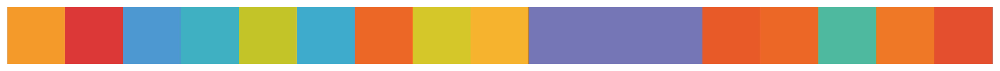

In [138]:
plot_palette(pub)
plt.savefig("/storage/data/2405_revision/240527_neural_subtype_de_update/datasets-prot_vs_braun/colorbar_pub.pdf", bbox_inches="tight", dpi=300)

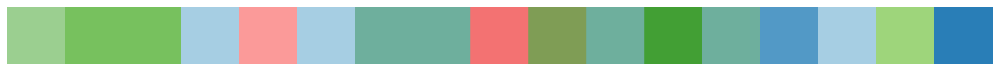

In [139]:
plot_palette(prot)
plt.savefig("/storage/data/2405_revision/240527_neural_subtype_de_update/datasets-prot_vs_braun/colorbar_prot.pdf", bbox_inches="tight", dpi=300)

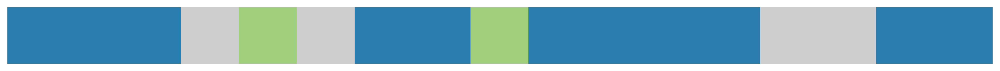

In [140]:
plot_palette(prot_type)
plt.savefig("/storage/data/2405_revision/240527_neural_subtype_de_update/datasets-prot_vs_braun/colorbar_prot_type.pdf", bbox_inches="tight", dpi=300)

In [61]:
pd.DataFrame(cleaned_features).to_csv("/storage/data/2405_revision/hnoca_cleaned_features_for_DE.tsv", sep="\t")

# Compute metabolism-related stress scores

In [57]:
adata_merge = anndata.concat([adata, adata_braun, adata_eze, adata_camp])

In [58]:
# load go terms downloaded from enrichr webpage
geneset_dict = {}
with open("/storage/data/neural_subtype_de/enrichment/GO_Biological_Process_2021", 'r') as f:
    for l in f.readlines():
        if l.startswith(("canonical glycolysis", "mitochondrial ATP synthesis coupled electron transport")): # "aerobic electron transport chain", "mitochondrial ATP synthesis coupled electron transport"
            geneset_dict[l.split(" (")[0]] = l.split("\t")[2:-1]

In [59]:
# Add msigdb Hallmark Glycolysis geneset
geneset_dict["hallmark glycolysis"] = np.array(pd.read_csv('https://www.gsea-msigdb.org/gsea/msigdb/human/download_geneset.jsp?geneSetName=HALLMARK_GLYCOLYSIS&fileType=TSV', sep='\t', header=None, index_col=0).loc['GENE_SYMBOLS',1].split(','))
geneset_dict["hallmark glycolysis"] = np.intersect1d(geneset_dict["hallmark glycolysis"], adata.var_names)

In [60]:
adata_merge.X = adata_merge.layers["counts"].copy()
sc.pp.normalize_total(adata_merge, target_sum=1e6)
sc.pp.log1p(adata_merge)

normalizing counts per cell
    finished (0:00:12)


In [61]:
adata_merge.obs["publication_protocol"] = adata_merge.obs["publication"] + "_" + adata_merge.obs["assay_differentiation"]

In [62]:
for k, v in geneset_dict.items():
     sc.tl.score_genes(adata_merge, v, score_name=f"{k.replace(' ', '_')}_score")

computing score 'canonical_glycolysis_score'
    finished: added
    'canonical_glycolysis_score', score of gene set (adata.obs).
    747 total control genes are used. (0:00:50)
computing score 'mitochondrial_ATP_synthesis_coupled_electron_transport_score'
    finished: added
    'mitochondrial_ATP_synthesis_coupled_electron_transport_score', score of gene set (adata.obs).
    647 total control genes are used. (0:00:52)
computing score 'hallmark_glycolysis_score'
    finished: added
    'hallmark_glycolysis_score', score of gene set (adata.obs).
    1183 total control genes are used. (0:00:54)


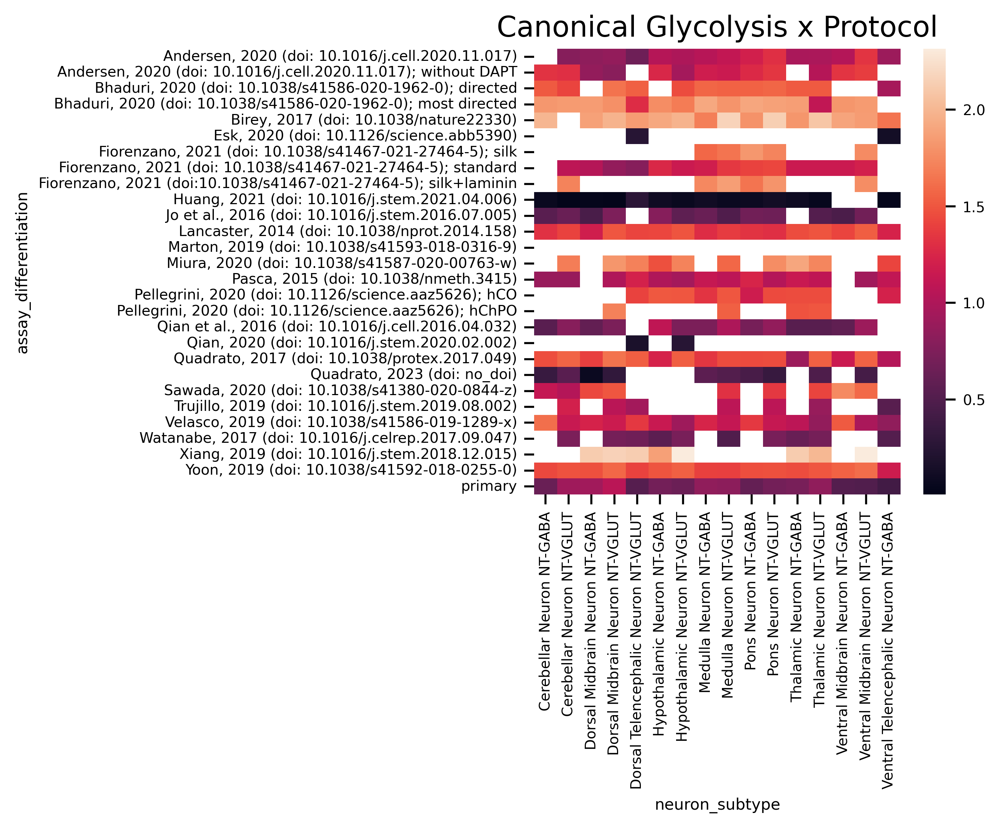

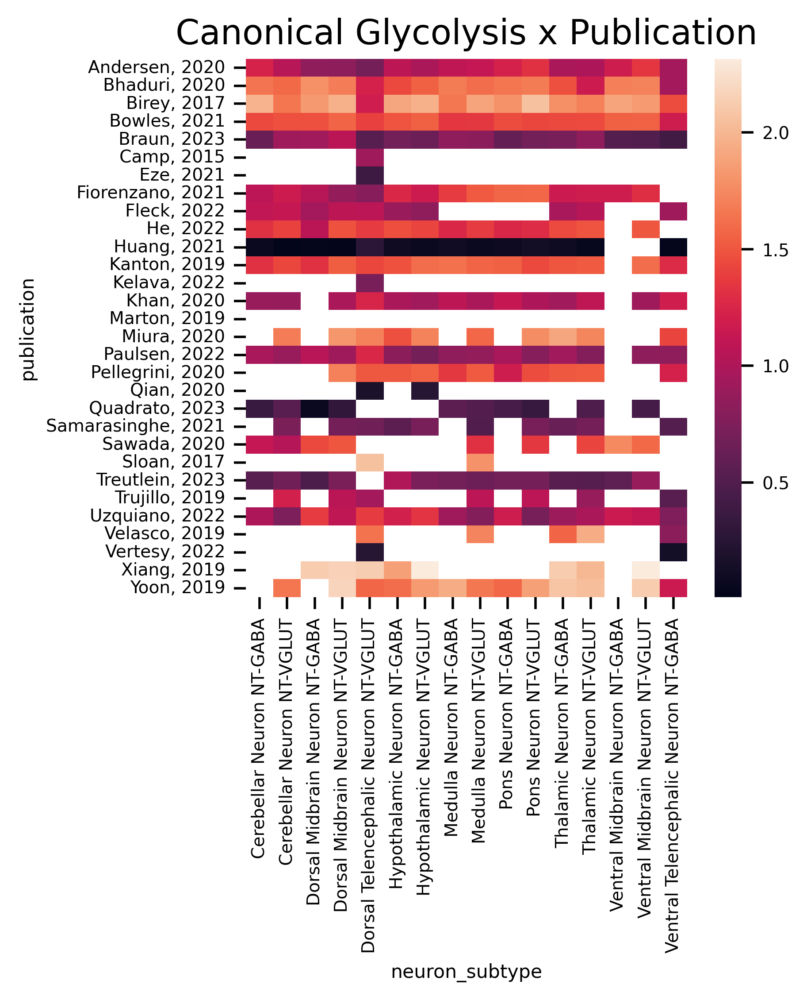

In [63]:
clusters = [i for i in adata.obs["neuron_subtype"].value_counts().index if "NT-VGLUT" in i or "NT-GABA" in i]
a = adata_merge[adata_merge.obs["neuron_subtype"].isin(clusters)]

df = pd.crosstab(a.obs["assay_differentiation"], a.obs["neuron_subtype"], a.obs["canonical_glycolysis_score"], aggfunc=np.mean)
df[pd.crosstab(a.obs["assay_differentiation"], a.obs["neuron_subtype"], a.obs["canonical_glycolysis_score"], aggfunc=np.count_nonzero)<20] = np.nan
with mpl.rc_context({"axes.grid" : False}):
    with sns.plotting_context("paper", font_scale=0.8):
        ax = sns.heatmap(df, yticklabels=True, xticklabels=True)
plt.title("Canonical Glycolysis x Protocol")
plt.show()

df = pd.crosstab(a.obs["publication"], a.obs["neuron_subtype"], a.obs["canonical_glycolysis_score"], aggfunc=np.mean)
df[pd.crosstab(a.obs["publication"], a.obs["neuron_subtype"], a.obs["canonical_glycolysis_score"], aggfunc=np.count_nonzero)<20] = np.nan
with mpl.rc_context({"axes.grid" : False}):
    with sns.plotting_context("paper", font_scale=0.8):
        ax = sns.heatmap(df, yticklabels=True, xticklabels=True)
plt.title("Canonical Glycolysis x Publication")
plt.show()

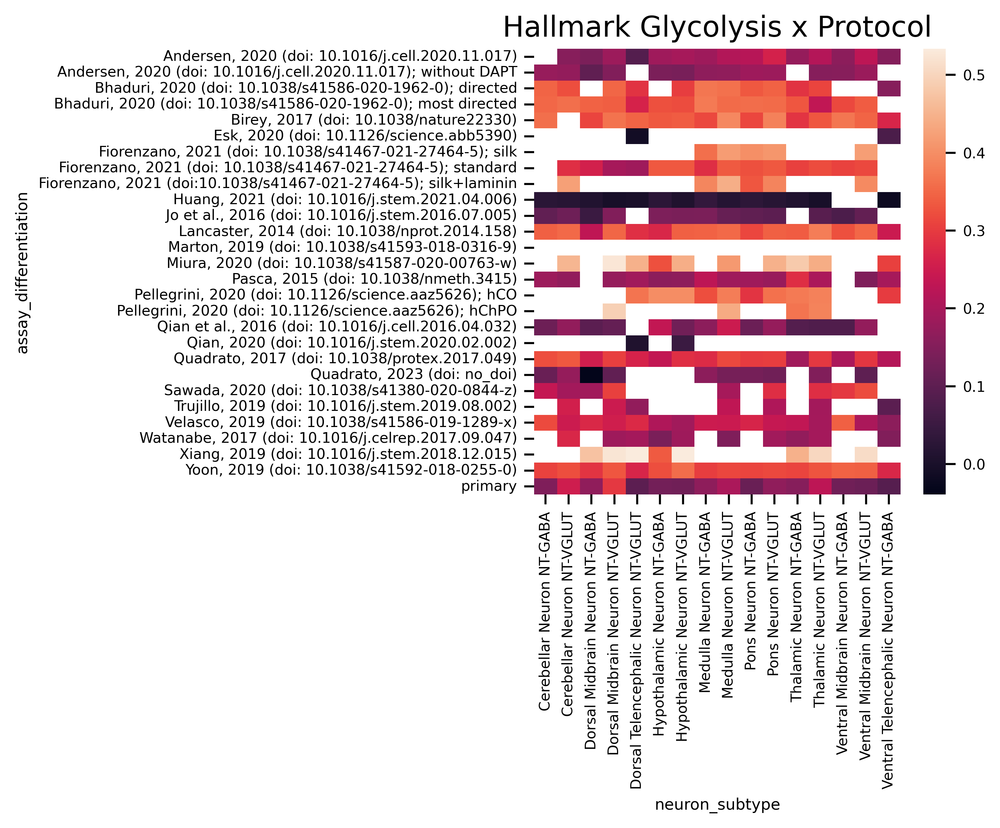

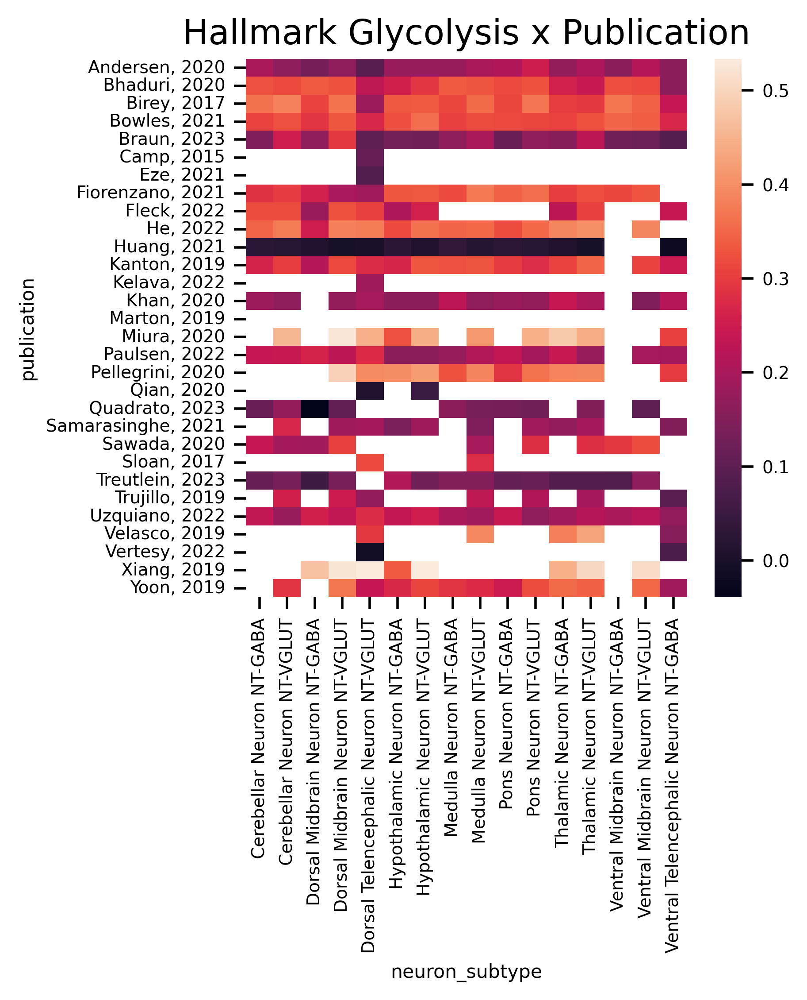

In [64]:
clusters = [i for i in adata.obs["neuron_subtype"].value_counts().index if "NT-VGLUT" in i or "NT-GABA" in i]
a = adata_merge[adata_merge.obs["neuron_subtype"].isin(clusters)]

df = pd.crosstab(a.obs["assay_differentiation"], a.obs["neuron_subtype"], a.obs["hallmark_glycolysis_score"], aggfunc=np.mean)
df[pd.crosstab(a.obs["assay_differentiation"], a.obs["neuron_subtype"], a.obs["hallmark_glycolysis_score"], aggfunc=np.count_nonzero)<20] = np.nan
with mpl.rc_context({"axes.grid" : False}):
    with sns.plotting_context("paper", font_scale=0.8):
        ax = sns.heatmap(df, yticklabels=True, xticklabels=True)
plt.title("Hallmark Glycolysis x Protocol")
plt.show()

df = pd.crosstab(a.obs["publication"], a.obs["neuron_subtype"], a.obs["hallmark_glycolysis_score"], aggfunc=np.mean)
df[pd.crosstab(a.obs["publication"], a.obs["neuron_subtype"], a.obs["hallmark_glycolysis_score"], aggfunc=np.count_nonzero)<20] = np.nan
with mpl.rc_context({"axes.grid" : False}):
    with sns.plotting_context("paper", font_scale=0.8):
        ax = sns.heatmap(df, yticklabels=True, xticklabels=True)
plt.title("Hallmark Glycolysis x Publication")
plt.show()

In [65]:
adata_merge.obs.groupby("publication_protocol").quantile(0.5)["canonical_glycolysis_score"].sort_values()

publication_protocol
Huang, 2021_Huang, 2021 (doi: 10.1016/j.stem.2021.04.006)                           0.068245
Qian, 2020_Qian, 2020 (doi: 10.1016/j.stem.2020.02.002)                             0.095227
Vertesy, 2022_Esk, 2020 (doi: 10.1126/science.abb5390)                              0.180951
Eze, 2021_primary                                                                   0.318656
Quadrato, 2023_Quadrato, 2023 (doi: no_doi)                                         0.406872
Treutlein, 2023_Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)                   0.512669
Samarasinghe, 2021_Watanabe, 2017 (doi: 10.1016/j.celrep.2017.09.047)               0.601179
Treutlein, 2023_Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)                 0.639412
Braun, 2023_primary                                                                 0.641823
Kelava, 2022_Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hCO                   0.691252
Trujillo, 2019_Trujillo, 2019 (doi: 10.1016/j.ste

In [66]:
adata_merge.obs.groupby("publication_protocol").quantile(0.5)["hallmark_glycolysis_score"].sort_values()

publication_protocol
Qian, 2020_Qian, 2020 (doi: 10.1016/j.stem.2020.02.002)                            -0.001809
Vertesy, 2022_Esk, 2020 (doi: 10.1126/science.abb5390)                              0.009243
Huang, 2021_Huang, 2021 (doi: 10.1016/j.stem.2021.04.006)                           0.014213
Eze, 2021_primary                                                                   0.066499
Treutlein, 2023_Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)                   0.088989
Marton, 2019_Marton, 2019 (doi: 10.1038/s41593-018-0316-9)                          0.090177
Camp, 2015_primary                                                                  0.113829
Treutlein, 2023_Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)                 0.117010
Quadrato, 2023_Quadrato, 2023 (doi: no_doi)                                         0.136431
Braun, 2023_primary                                                                 0.148710
Andersen, 2020_Andersen, 2020 (doi: 10.1016/j.cel

In [67]:
adata_merge.obs.groupby("publication_protocol").mean()["canonical_glycolysis_score"].sort_values()

publication_protocol
Huang, 2021_Huang, 2021 (doi: 10.1016/j.stem.2021.04.006)                           0.093385
Qian, 2020_Qian, 2020 (doi: 10.1016/j.stem.2020.02.002)                             0.178260
Vertesy, 2022_Esk, 2020 (doi: 10.1126/science.abb5390)                              0.211396
Eze, 2021_primary                                                                   0.384232
Quadrato, 2023_Quadrato, 2023 (doi: no_doi)                                         0.437136
Treutlein, 2023_Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)                   0.585730
Braun, 2023_primary                                                                 0.648898
Samarasinghe, 2021_Watanabe, 2017 (doi: 10.1016/j.celrep.2017.09.047)               0.656742
Kelava, 2022_Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hCO                   0.707693
Treutlein, 2023_Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)                 0.721400
Trujillo, 2019_Trujillo, 2019 (doi: 10.1016/j.ste

In [68]:
adata_merge.obs.groupby("publication_protocol").mean()["hallmark_glycolysis_score"].sort_values()

publication_protocol
Qian, 2020_Qian, 2020 (doi: 10.1016/j.stem.2020.02.002)                             0.010583
Vertesy, 2022_Esk, 2020 (doi: 10.1126/science.abb5390)                              0.015427
Huang, 2021_Huang, 2021 (doi: 10.1016/j.stem.2021.04.006)                           0.021507
Marton, 2019_Marton, 2019 (doi: 10.1038/s41593-018-0316-9)                          0.037005
Eze, 2021_primary                                                                   0.080125
Treutlein, 2023_Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)                   0.102378
Camp, 2015_primary                                                                  0.112387
Treutlein, 2023_Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)                 0.137480
Quadrato, 2023_Quadrato, 2023 (doi: no_doi)                                         0.138590
Braun, 2023_primary                                                                 0.152885
Trujillo, 2019_Trujillo, 2019 (doi: 10.1016/j.ste

In [69]:
adata_merge.obs.to_csv("/storage/data/2405_revision/240527_neural_subtype_de_update/obs_stress_scores_revision.tsv.gz", sep="\t")

In [70]:
adata_merge.write("/mnt/data/240527_subtype_de_analysis_revision/adata_merge_stressscores.h5ad")